# **Adult Income Prediction** 

Pipline, Logistic Regression, KNN, GridSearchCV, CrossValidation, SMOTE

**Data Set Information:**

This dataset was obtained from UCI Machine Learning Repository. The aim of this problem is to classify adults in two different groups based on their income where group 1 has an income less than USD 50k and group 2 has an income of more than or equal to USD 50k. The data available at hand comes from Census 1994.


**Attribute Information:**

**Age:** Describes the age of individuals. Continuous.

**Workclass:** Private, Self-emp-not-inc, Self-emp-inc, Federal-gov, Local-gov, State-gov, Without-pay, Never-worked.

**fnlwgt:** Final Weight Determined by Census Org. Continuous.

**education:** Bachelors, Some-college, 11th, HS-grad, Prof-school, Assoc-acdm, Assoc-voc, 9th, 7th-8th, 12th, Masters, 1st-4th, 10th, Doctorate, 5th-6th, Preschool. 

**education-num:** Number of years spent in education. Integer.

**marital-status:** Married-civ-spouse, Divorced, Never-married, Separated, Widowed, Married-spouse-absent, Married-AF-spouse.

**occupation:** Tech-support, Craft-repair, Other-service, Sales, Exec-managerial, Prof-specialty, Handlers-cleaners, Machine-op-inspct, Adm-clerical, Farming-fishing, Transport-moving, Priv-house-serv, Protective-serv, Armed-Forces.

**relationship:** Wife, Own-child, Husband, Not-in-family, Other-relative, Unmarried.

**race:** White, Asian-Pac-Islander, Amer-Indian-Eskimo, Other, Black.

**sex:** Female, Male.

**capital-gain:** Capital gain made by the individual. Continuous.

**capital-loss:** Capital loss made by the individual. Continuous.

**hours-per-week:** Average number of hours spent by the individual on work. Continuous.

**native-country:** Native country of origin. United-States, Cambodia, England, Puerto-Rico, Canada, Germany, Outlying-US(Guam-USVI-etc), India, Japan, Greece, South, China, Cuba, Iran, Honduras, Philippines, Italy, Poland, Jamaica, Vietnam, Mexico, Portugal, Ireland, France, Dominican-Republic, Laos, Ecuador, Taiwan, Haiti, Columbia, Hungary, Guatemala, Nicaragua, Scotland, Thailand, Yugoslavia, El-Salvador, Trinadad&Tobago, Peru, Hong, Holand-Netherlands. Categorical

**salary:** Income Level.  >50K,<=50K. Categorical


For more information; 
https://www.kaggle.com/code/overload10/income-prediction-on-uci-adult-dataset  
    
https://rstudio-pubs-static.s3.amazonaws.com/230766_1628cb3f6e624ad3aec435f5821185d7.html  

# Exploratory Data Analysis and Visualization

## Import Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly
import plotly.express as px
import cufflinks as cf

plt.rcParams["figure.figsize"] = (15,7)

from plotly.offline import download_plotlyjs,init_notebook_mode,plot,iplot 
init_notebook_mode(connected=True)
cf.go_offline()

# %matplotlib inline 

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import log_loss, recall_score, accuracy_score, precision_score, f1_score
from sklearn.metrics import confusion_matrix, classification_report, plot_confusion_matrix
from sklearn.metrics import plot_roc_curve, plot_precision_recall_curve, roc_auc_score, auc
from sklearn.metrics import roc_curve, average_precision_score, precision_recall_curve
from sklearn.pipeline import Pipeline

import warnings
warnings.filterwarnings("ignore")
warnings.warn("this will not show")

## Look at he data set

In [2]:
df = pd.read_csv("adult.csv") 

In [3]:
df.head(5)

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
1,82,Private,132870,HS-grad,9,Widowed,Exec-managerial,Not-in-family,White,Female,0,4356,18,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
3,54,Private,140359,7th-8th,4,Divorced,Machine-op-inspct,Unmarried,White,Female,0,3900,40,United-States,<=50K
4,41,Private,264663,Some-college,10,Separated,Prof-specialty,Own-child,White,Female,0,3900,40,United-States,<=50K


In [4]:
df.tail(5)

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
32556,22,Private,310152,Some-college,10,Never-married,Protective-serv,Not-in-family,White,Male,0,0,40,United-States,<=50K
32557,27,Private,257302,Assoc-acdm,12,Married-civ-spouse,Tech-support,Wife,White,Female,0,0,38,United-States,<=50K
32558,40,Private,154374,HS-grad,9,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,0,40,United-States,>50K
32559,58,Private,151910,HS-grad,9,Widowed,Adm-clerical,Unmarried,White,Female,0,0,40,United-States,<=50K
32560,22,Private,201490,HS-grad,9,Never-married,Adm-clerical,Own-child,White,Male,0,0,20,United-States,<=50K


In [5]:
df.sample(5)

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
7615,19,Private,251579,Some-college,10,Never-married,Other-service,Own-child,White,Male,0,0,14,United-States,<=50K
28038,32,Private,61898,11th,7,Divorced,Other-service,Unmarried,White,Female,0,0,15,United-States,<=50K
32331,30,Never-worked,176673,HS-grad,9,Married-civ-spouse,?,Wife,Black,Female,0,0,40,United-States,<=50K
9491,37,Private,410913,HS-grad,9,Married-spouse-absent,Farming-fishing,Unmarried,Other,Male,0,0,40,Mexico,<=50K
14514,48,Private,160647,Some-college,10,Never-married,Exec-managerial,Not-in-family,White,Female,0,0,40,Ireland,>50K


## Summary statistics

In [6]:
df.shape

(32561, 15)

* 32561 satir ve 15 sutundan olusuyor data seti.

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32561 entries, 0 to 32560
Data columns (total 15 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             32561 non-null  int64 
 1   workclass       32561 non-null  object
 2   fnlwgt          32561 non-null  int64 
 3   education       32561 non-null  object
 4   education.num   32561 non-null  int64 
 5   marital.status  32561 non-null  object
 6   occupation      32561 non-null  object
 7   relationship    32561 non-null  object
 8   race            32561 non-null  object
 9   sex             32561 non-null  object
 10  capital.gain    32561 non-null  int64 
 11  capital.loss    32561 non-null  int64 
 12  hours.per.week  32561 non-null  int64 
 13  native.country  32561 non-null  object
 14  income          32561 non-null  object
dtypes: int64(6), object(9)
memory usage: 3.7+ MB


In [8]:
df.isnull().any().any()

False

* Data setinde null deger yoktur. 

* Degiskenlerden integer ve oject forumda olanlar bulunmaktadir. 

### Data Balanced or Not?

In [9]:
df.income.value_counts()

<=50K    24720
>50K      7841
Name: income, dtype: int64

In [10]:
df.income.value_counts(normalize = True)

<=50K    0.75919
>50K     0.24081
Name: income, dtype: float64

* Hedef degiskene gore gozlemlerin %75'i ilk kategoride, %25'i ikinci kategoride yer almakta olup, **veri seti unbalanced** yani dengesizdir.

### Duplicated Data

In [11]:
df.duplicated().sum() # duplice data var mi kontrol ediyoruz.

24

* 24 tane dublicate veri vardir. Ama bunlar farkli kisiler de olabilirler. Bu nedenle analizden atmayacagim bunlari.

In [12]:
# For unique values;

def get_unique_values(df):
    
    output_data = []

    for col in df.columns:

        # If the number of unique values in the column is less than or equal to 5
        if df.loc[:, col].nunique() <= 50:
            # Get the unique values in the column
            unique_values = df.loc[:, col].unique()
            # Append the column name, number of unique values, unique values, and data type to the output data
            output_data.append([col, df.loc[:, col].nunique(), unique_values, df.loc[:, col].dtype])
        else:
            # Otherwise, append only the column name, number of unique values, and data type to the output data
            output_data.append([col, df.loc[:, col].nunique(),"-", df.loc[:, col].dtype])

    output_df = pd.DataFrame(output_data, columns=['Column Name', 'Number of Unique Values', ' Unique Values ', 'Data Type'])

    return output_df

get_unique_values(df)

,Column Name,Number of Unique Values,Unique Values,Data Type
0,age,73,-,int64
1,workclass,9,"[?, Private, State-gov, Federal-gov, Self-emp-...",object
2,fnlwgt,21648,-,int64
3,education,16,"[HS-grad, Some-college, 7th-8th, 10th, Doctora...",object
4,education.num,16,"[9, 10, 4, 6, 16, 15, 13, 14, 7, 12, 11, 2, 3,...",int64
5,marital.status,7,"[Widowed, Divorced, Separated, Never-married, ...",object
6,occupation,15,"[?, Exec-managerial, Machine-op-inspct, Prof-s...",object
7,relationship,6,"[Not-in-family, Unmarried, Own-child, Other-re...",object
8,race,5,"[White, Black, Asian-Pac-Islander, Other, Amer...",object
9,sex,2,"[Female, Male]",object


In [13]:
# Veri setinde ? gordum, nerelerde var oldugunu gorebilmek icin bu kodu kullandim; 

for feature in df.columns:
    if df[feature].dtype=="object":
        print(df[feature].unique())

['?' 'Private' 'State-gov' 'Federal-gov' 'Self-emp-not-inc' 'Self-emp-inc'
 'Local-gov' 'Without-pay' 'Never-worked']
['HS-grad' 'Some-college' '7th-8th' '10th' 'Doctorate' 'Prof-school'
 'Bachelors' 'Masters' '11th' 'Assoc-acdm' 'Assoc-voc' '1st-4th' '5th-6th'
 '12th' '9th' 'Preschool']
['Widowed' 'Divorced' 'Separated' 'Never-married' 'Married-civ-spouse'
 'Married-spouse-absent' 'Married-AF-spouse']
['?' 'Exec-managerial' 'Machine-op-inspct' 'Prof-specialty'
 'Other-service' 'Adm-clerical' 'Craft-repair' 'Transport-moving'
 'Handlers-cleaners' 'Sales' 'Farming-fishing' 'Tech-support'
 'Protective-serv' 'Armed-Forces' 'Priv-house-serv']
['Not-in-family' 'Unmarried' 'Own-child' 'Other-relative' 'Husband' 'Wife']
['White' 'Black' 'Asian-Pac-Islander' 'Other' 'Amer-Indian-Eskimo']
['Female' 'Male']
['United-States' '?' 'Mexico' 'Greece' 'Vietnam' 'China' 'Taiwan' 'India'
 'Philippines' 'Trinadad&Tobago' 'Canada' 'South' 'Holand-Netherlands'
 'Puerto-Rico' 'Poland' 'Iran' 'England' 'Germ

* Veri setinde "workclass", "occupation" ve "native.country" columnsda ? olarak girilen yerler var, bunlari duzeltmemiz/ cozmemiz gertekmekte. 

## Feature Engineering

### Handling the ?s

In [14]:
# "workclass" sutununda ? girilmis ucre var. Once onu bir gorelim;

df[df["workclass"]=="?"]

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
14,51,?,172175,Doctorate,16,Never-married,?,Not-in-family,White,Male,0,2824,40,United-States,>50K
24,61,?,135285,HS-grad,9,Married-civ-spouse,?,Husband,White,Male,0,2603,32,United-States,<=50K
44,71,?,100820,HS-grad,9,Married-civ-spouse,?,Husband,White,Male,0,2489,15,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32533,35,?,320084,Bachelors,13,Married-civ-spouse,?,Wife,White,Female,0,0,55,United-States,>50K
32534,30,?,33811,Bachelors,13,Never-married,?,Not-in-family,Asian-Pac-Islander,Female,0,0,99,United-States,<=50K
32541,71,?,287372,Doctorate,16,Married-civ-spouse,?,Husband,White,Male,0,0,10,United-States,>50K
32543,41,?,202822,HS-grad,9,Separated,?,Not-in-family,Black,Female,0,0,32,United-States,<=50K


* "workclass" sutununa ? girilmis 1836 gozlem bulunmaktadir.  Bu kisilerin "occupation" sutunlarinda da ? oldugu dikkati cekmistir. 

In [15]:
# "occupation" sutununda ? girilmis ucre var. Once onu bir gorelim;

df[df["occupation"]=="?"]

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
14,51,?,172175,Doctorate,16,Never-married,?,Not-in-family,White,Male,0,2824,40,United-States,>50K
24,61,?,135285,HS-grad,9,Married-civ-spouse,?,Husband,White,Male,0,2603,32,United-States,<=50K
44,71,?,100820,HS-grad,9,Married-civ-spouse,?,Husband,White,Male,0,2489,15,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32533,35,?,320084,Bachelors,13,Married-civ-spouse,?,Wife,White,Female,0,0,55,United-States,>50K
32534,30,?,33811,Bachelors,13,Never-married,?,Not-in-family,Asian-Pac-Islander,Female,0,0,99,United-States,<=50K
32541,71,?,287372,Doctorate,16,Married-civ-spouse,?,Husband,White,Male,0,0,10,United-States,>50K
32543,41,?,202822,HS-grad,9,Separated,?,Not-in-family,Black,Female,0,0,32,United-States,<=50K


* "occupation" sutununa ? girilmis 1843 gozlem bulunmaktadir. 

In [16]:
# "workclass" ve "occupation" sutunlarina ? girilen kisilerden kac tanesi ortak? Buna bakalim.

df[ (df["workclass"]=="?") & (df["occupation"]=="?")]

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
0,90,?,77053,HS-grad,9,Widowed,?,Not-in-family,White,Female,0,4356,40,United-States,<=50K
2,66,?,186061,Some-college,10,Widowed,?,Unmarried,Black,Female,0,4356,40,United-States,<=50K
14,51,?,172175,Doctorate,16,Never-married,?,Not-in-family,White,Male,0,2824,40,United-States,>50K
24,61,?,135285,HS-grad,9,Married-civ-spouse,?,Husband,White,Male,0,2603,32,United-States,<=50K
44,71,?,100820,HS-grad,9,Married-civ-spouse,?,Husband,White,Male,0,2489,15,United-States,<=50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32533,35,?,320084,Bachelors,13,Married-civ-spouse,?,Wife,White,Female,0,0,55,United-States,>50K
32534,30,?,33811,Bachelors,13,Never-married,?,Not-in-family,Asian-Pac-Islander,Female,0,0,99,United-States,<=50K
32541,71,?,287372,Doctorate,16,Married-civ-spouse,?,Husband,White,Male,0,0,10,United-States,>50K
32543,41,?,202822,HS-grad,9,Separated,?,Not-in-family,Black,Female,0,0,32,United-States,<=50K


* Demek ki "workdclass" sutununa ? girilen kisilerin "occupation" sutunlarina da ? girilmistir. Ayrica "occupation" sutununa ? girilen 7 gozlem daha buunmaktadir.

In [17]:
# Benzer sekilde "native.country" sutununda da ? girilmis ku=isiler oldugu goruluyor. Kac kisi olduklarina bakalim;

df[df["native.country"]=="?"]

,age,workclass,fnlwgt,education,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
9,41,Private,70037,Some-college,10,Never-married,Craft-repair,Unmarried,White,Male,0,3004,60,?,>50K
18,22,Private,119592,Assoc-acdm,12,Never-married,Handlers-cleaners,Not-in-family,Black,Male,0,2824,40,?,>50K
65,60,Self-emp-inc,226355,Assoc-voc,11,Married-civ-spouse,Machine-op-inspct,Husband,White,Male,0,2415,70,?,>50K
86,39,Self-emp-not-inc,218490,Prof-school,15,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,2415,50,?,>50K
87,43,Federal-gov,156996,Prof-school,15,Married-civ-spouse,Prof-specialty,Husband,Asian-Pac-Islander,Male,0,2415,55,?,>50K
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32459,44,Self-emp-inc,71556,Masters,14,Married-civ-spouse,Sales,Husband,White,Male,0,0,50,?,>50K
32476,58,Self-emp-inc,181974,Doctorate,16,Never-married,Prof-specialty,Not-in-family,White,Female,0,0,99,?,<=50K
32498,42,Self-emp-not-inc,217597,HS-grad,9,Divorced,Sales,Own-child,White,Male,0,0,50,?,<=50K
32515,39,Private,107302,HS-grad,9,Married-civ-spouse,Prof-specialty,Husband,White,Male,0,0,45,?,>50K


* 583 kisinin "native.country" verisi ? olarak girilmis. 

#### Drop empty value marked as '?'

* ? olarak girilen verileri oncelikle NymPy kutuphanesini kullanarak NaN yapalim, sonra da NaN valuelerin bulundugu gozlemleri (satirlari) drop edelim;

In [18]:
print (df.shape)

(32561, 15)


* Ilk durumunda 32561 gozlem var.

In [19]:
# ? ile girilen yerleri nan yapalim; 

df['workclass'] = df['workclass'].replace('?', np.nan)
df['occupation'] = df['occupation'].replace('?', np.nan)
df['native.country'] = df['native.country'].replace('?', np.nan)

In [20]:
# Tum nan valueleri dusurelim;

df.dropna(how='any',inplace=True)

In [21]:
df.shape

(30162, 15)

In [22]:
oran = (2399/32561) * 100
oran

7.367709836921471

* Son durumunda 30162 gozlem kaldi. 2399 gozlem (toplam gozlemlerin %7.4'u) silindi.

### Convert income to integer

Target variable olan income'in diger verilerle olan iliskisini EDA asamasinda da gorebilmek icin bu degiskeni sayisal hale getirelim;

In [23]:
df['income'] = df['income'].map({"<=50K": 0, ">50K": 1})
df['income']

1        0
3        0
4        0
5        0
6        0
        ..
32556    0
32557    0
32558    1
32559    0
32560    0
Name: income, Length: 30162, dtype: int64

### Drop the fnlwgt 

The fnlwgt which is the final weight determined by the Census Organization is of no use in any of the analysis that we are doing henceforth and is removed. (ABD'nin Nüfus Sayım Örgütü olan (Census Organization) tarafından belirlenen nihai ağırlık olan fnlwgt, bundan sonra yapacağımız hiçbir analizde kullanılmayacak ve kaldırılacaktır).

In [24]:
# df.drop(columns = 'fnlwgt', inplace = True)   # Bunu atmaktan vaz gectim

### Drop the education
Egitim verisini sayisal olarak kullanmak istadigimiz icin "ducation"verisini de veri setibdeb dusurelim.

In [25]:
df.drop(columns = 'education', inplace = True)

### Focus on Categoricial Features

#### Marital Status

In [26]:
df["marital.status"].unique()

array(['Widowed', 'Divorced', 'Separated', 'Never-married',
       'Married-civ-spouse', 'Married-spouse-absent', 'Married-AF-spouse'],
      dtype=object)

In [27]:
# Burada birbiriyle ayni/bezner seyleri ifade eden kategoriler bulunmakta. 
# Ornegin; Married-civ-spouse; sivil bir es ile evli olan kisileri gosterirken, Married-AF-spouse; asker bir es ile evli 
# olanlari, Married-spouse-absent; evli ama esi uzakta calisanlari ifade etmektedir. Ama sonucta bunlarin hepsi evli. 
# Bu nedenle "marital.status" a gore kisileri toplulastiralim. 
# Bu amacla evli ('Married-civ-spouse', 'Married-spouse-absent', 'Married-AF-spouse')  olanlari 1, digerlerini 0 yapalim.

In [28]:
# Create a dictionary to map marital statuses to the desired values
marital_status_list = ['Widowed', 'Divorced', 'Separated', 'Never-married',
                       'Married-civ-spouse', 'Married-spouse-absent', 'Married-AF-spouse']
marital_status_dict = {
    'Widowed': 0,
    'Divorced': 0,
    'Separated': 0,
    'Never-married': 0,
    'Married-civ-spouse': 1,
    'Married-spouse-absent': 1,
    'Married-AF-spouse': 1
}

# Map the values in the 'Marital Status' column using the dictionary
df['marital.status'] = df['marital.status'].map(marital_status_dict)

In [29]:
df["marital.status"].unique()

array([0, 1], dtype=int64)

#### Native Country

In [30]:
df["native.country"].unique()

array(['United-States', 'Mexico', 'Greece', 'Vietnam', 'China', 'Taiwan',
       'India', 'Philippines', 'Trinadad&Tobago', 'Canada', 'South',
       'Holand-Netherlands', 'Puerto-Rico', 'Poland', 'Iran', 'England',
       'Germany', 'Italy', 'Japan', 'Hong', 'Honduras', 'Cuba', 'Ireland',
       'Cambodia', 'Peru', 'Nicaragua', 'Dominican-Republic', 'Haiti',
       'Hungary', 'Columbia', 'Guatemala', 'El-Salvador', 'Jamaica',
       'Ecuador', 'France', 'Yugoslavia', 'Portugal', 'Laos', 'Thailand',
       'Outlying-US(Guam-USVI-etc)', 'Scotland'], dtype=object)

* Burada cok fazla ulke bilgisi var. Bu veri seti ABD'de yasayan kisilerin gelirlerine odaklandigi icin burada onemli olan; incelene kisinin ABD vatandasi olup olmadigidir. Bu nedenle bu feature'i 'United-States' = 1, digerleri = 0 olacak sekilde duzenleyelim;  

In [31]:
# Create a dictionary to map native.country to the desired values
country_list = ['United-States', 'Mexico', 'Greece', 'Vietnam', 'China', 'Taiwan',
                'India', 'Philippines', 'Trinadad&Tobago', 'Canada', 'South',
                'Holand-Netherlands', 'Puerto-Rico', 'Poland', 'Iran', 'England',
                'Germany', 'Italy', 'Japan', 'Hong', 'Honduras', 'Cuba', 'Ireland',
                'Cambodia', 'Peru', 'Nicaragua', 'Dominican-Republic', 'Haiti',
                'Hungary', 'Columbia', 'Guatemala', 'El-Salvador', 'Jamaica',
                'Ecuador', 'France', 'Yugoslavia', 'Portugal', 'Laos', 'Thailand',
                'Outlying-US(Guam-USVI-etc)', 'Scotland']

# Create a dictionary to map countries to the desired values
country_dict = {country: 1 if country == 'United-States' else 0 for country in country_list}

# Map the values in the 'Country' column using the dictionary
df['native.country'] = df['native.country'].map(country_dict)

In [32]:
df["native.country"].unique()

array([1, 0], dtype=int64)

#### Race

Eski ABD anlayisina gore irk noktasind calisan kisinin "White" olup olmadigi onemli idi. Bu veriyi de "White" = 1, digerleri = 0 seklinde degistirelim;

In [33]:
df["race"].unique()

array(['White', 'Black', 'Asian-Pac-Islander', 'Other',
       'Amer-Indian-Eskimo'], dtype=object)

In [34]:
# Create a dictionary to map race to the desired values
race_list = ['White', 'Black', 'Asian-Pac-Islander', 'Other', 'Amer-Indian-Eskimo']
race_dict = {
    'White': 1,
    'Black': 0,
    'Asian-Pac-Islander': 0,
    'Other': 0,
    'Amer-Indian-Eskimo': 0}

# Map the values in the 'race' column using the dictionary
df['race'] = df['race'].map(race_dict)

In [35]:
df["race"].unique()

array([1, 0], dtype=int64)

#### Sex

Cinsiyet noktasinda elimizde 2 grup bulunmakta olup, bu konudaki calismalarda genellikle kadinlara yonelik negatif bir ayrimcilik olup olmadigina bakilmaktadir. Bu amacla da genellikle male = 1, female = 0 verilerek kategorik seri numerik hale getirilmektedir (Verniers and Vala (2018); Guo et al. (2022); Kraft (2022)). 

In [36]:
df['sex'] = df['sex'].map({"Female": 0, "Male": 1})
df['sex']

1        0
3        0
4        0
5        0
6        1
        ..
32556    1
32557    0
32558    1
32559    0
32560    1
Name: sex, Length: 30162, dtype: int64

#### Relationship

In [37]:
df["relationship"].unique()

array(['Not-in-family', 'Unmarried', 'Own-child', 'Other-relative',
       'Husband', 'Wife'], dtype=object)

* Bu featurede yer alan 'Husband', 'Wife' ve 'Own-child'; evli ve sorumluluk sahibi kisileri gosterdigi icin 1, digerleri 0 olarak sinifladirilabilir.  

In [38]:
# Create a dictionary to map relationship to the desired values
relationship_list = ['Not-in-family', 'Unmarried', 'Own-child', 'Other-relative', 'Husband', 'Wife']
relationship_dict = {
    'Not-in-family': 0,
    'Unmarried': 0,
    'Own-child': 1,
    'Other-relative': 0,
    'Husband': 1,
    'Wife': 1}

# Map the values in the 'race' column using the dictionary
df['relationship'] = df['relationship'].map(relationship_dict)

In [39]:
df["relationship"].unique()

array([0, 1], dtype=int64)

## Copy 

In [40]:
# Data Frame'in duzgun halinin yedegini alalim;
df2 = df.copy()
df2.head(2)

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
1,82,Private,132870,9,0,Exec-managerial,0,1,0,0,4356,18,1,0
3,54,Private,140359,4,0,Machine-op-inspct,0,1,0,0,3900,40,1,0


In [257]:
df = df2.copy()
df.head(2)

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
1,82,Private,132870,9,0,Exec-managerial,0,1,0,0,4356,18,1,0
3,54,Private,140359,4,0,Machine-op-inspct,0,1,0,0,3900,40,1,0


## Destcriptive Statistics

In [42]:
# Yalnızca sayısal sütunları seçmek
numerical_columns = df.select_dtypes(include=['float64', 'int64'])

# Korelasyon matrisini hesaplamak
df.corr = numerical_columns.corr()
df.corr


,age,fnlwgt,education.num,marital.status,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
age,1.000000,-0.076511,0.043526,0.310553,0.013970,0.026906,0.081993,0.080154,0.060165,0.101599,0.016259,0.241998
fnlwgt,-0.076511,1.000000,-0.044992,-0.028083,-0.020698,-0.058804,0.025362,0.000422,-0.009750,-0.022886,-0.083390,-0.008957
education.num,0.043526,-0.044992,1.000000,0.071685,0.018316,0.052615,0.006157,0.124416,0.079646,0.152522,0.127207,0.335286
marital.status,0.310553,-0.028083,0.071685,1.000000,0.707998,0.097076,0.426348,0.082616,0.078615,0.221492,-0.030453,0.436142
relationship,0.013970,-0.020698,0.018316,0.707998,1.000000,0.100285,0.374173,0.048929,0.047296,0.038664,0.031802,0.294162
race,0.026906,-0.058804,0.052615,0.097076,0.100285,1.000000,0.105148,0.016933,0.026197,0.056404,0.192115,0.084735
sex,0.081993,0.025362,0.006157,0.426348,0.374173,0.105148,1.000000,0.048814,0.047011,0.231268,-0.003006,0.216699
capital.gain,0.080154,0.000422,0.124416,0.082616,0.048929,0.016933,0.048814,1.000000,-0.032229,0.080432,0.012375,0.221196
capital.loss,0.060165,-0.009750,0.079646,0.078615,0.047296,0.026197,0.047011,-0.032229,1.000000,0.052417,0.015119,0.150053
hours.per.week,0.101599,-0.022886,0.152522,0.221492,0.038664,0.056404,0.231268,0.080432,0.052417,1.000000,0.010673,0.229480


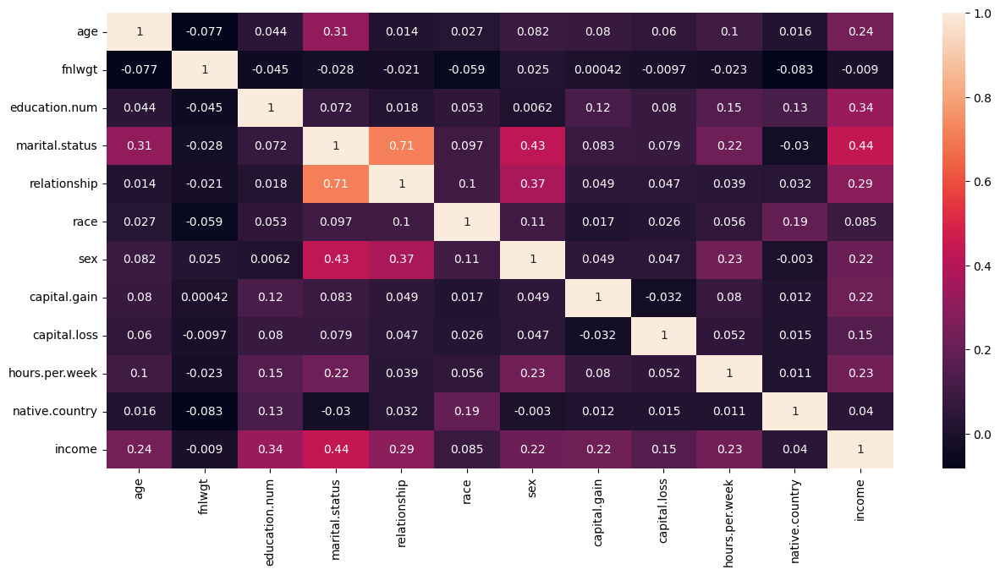

In [43]:
sns.heatmap(df.corr, annot = True);

* Features arasinda guclu bir korelasyon bulunmamaktadir. 

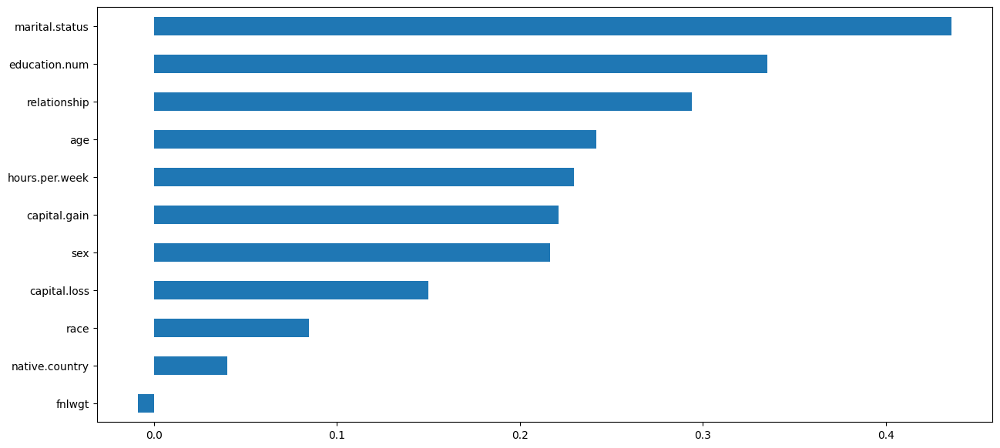

In [44]:
# Let's look at the relationship between features and target variable with the help of a graph;

df.corr["income"].drop("income").sort_values().plot.barh()
plt.show()

* Income ile en yuksek iliskiye sahip olan featurenin; alinan egitim suresi ve yas (tecrube) oldugu gorulmektedir. 

## Data Visulation



In [45]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 30162 entries, 1 to 32560
Data columns (total 14 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   age             30162 non-null  int64 
 1   workclass       30162 non-null  object
 2   fnlwgt          30162 non-null  int64 
 3   education.num   30162 non-null  int64 
 4   marital.status  30162 non-null  int64 
 5   occupation      30162 non-null  object
 6   relationship    30162 non-null  int64 
 7   race            30162 non-null  int64 
 8   sex             30162 non-null  int64 
 9   capital.gain    30162 non-null  int64 
 10  capital.loss    30162 non-null  int64 
 11  hours.per.week  30162 non-null  int64 
 12  native.country  30162 non-null  int64 
 13  income          30162 non-null  int64 
dtypes: int64(12), object(2)
memory usage: 3.5+ MB


### Categoricial Data Analysis

In [46]:
# Sutunlari kategorik ve numerik olanlar seklinde gruplandiralim;


# Kategorik kolonlari numerik kolonlardan ayiriyoruz. Kategori sayisi 10 dan kucukse kategorik  olarak alacak.

def grab_col_names(dataframe, cat_th=10):

    # cat_cols
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "object"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "object"]    
    cat_cols = cat_cols + num_but_cat
    

    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "object"]
    num_cols = [col for col in num_cols if col not in cat_cols]

    print(f"Features: {dataframe.shape[1]}")
    print(f'Number of Categorical Features: {len(cat_cols)}')
    print(f'Number of Numeric Features: {len(num_cols)}')
    
    
    return cat_cols, num_cols

cat_cols, num_cols = grab_col_names(df)

print("Categorical cols =", cat_cols)
print("Numerical cols =", num_cols)

Features: 14
Number of Categorical Features: 8
Number of Numeric Features: 6
Categorical cols = ['workclass', 'occupation', 'marital.status', 'relationship', 'race', 'sex', 'native.country', 'income']
Numerical cols = ['age', 'fnlwgt', 'education.num', 'capital.gain', 'capital.loss', 'hours.per.week']


In [47]:
def grab_col_names(dataframe, cat_th=10, car_th=20):
   
    # cat_cols, cat_but_car
    cat_cols = [col for col in dataframe.columns if dataframe[col].dtypes == "O"]
    num_but_cat = [col for col in dataframe.columns if dataframe[col].nunique() < cat_th and
                   dataframe[col].dtypes != "O"]
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_th and
                   dataframe[col].dtypes == "O"]
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]
    
    # num_cols
    num_cols = [col for col in dataframe.columns if dataframe[col].dtypes != "O"]
    num_cols = [col for col in num_cols if col not in num_but_cat]
    print(f"Observations(Gözlem): {dataframe.shape[0]}")
    print(f"Variables(Değişken): {dataframe.shape[1]}")
    print(f'cat_cols(kategorik Değişken): {len(cat_cols)}')
    print(f'num_cols(Numerik değişken): {len(num_cols)}')
    print(f'cat_but_car(Kardinal değişken): {len(cat_but_car)}')
    print(f'num_but_cat: {len(num_but_cat)}')
    return cat_cols, num_cols, cat_but_car

In [48]:
cat_cols, num_cols, cat_but_car = grab_col_names(df)

Observations(Gözlem): 30162
Variables(Değişken): 14
cat_cols(kategorik Değişken): 8
num_cols(Numerik değişken): 6
cat_but_car(Kardinal değişken): 0
num_but_cat: 6


In [49]:
print("Categoricial Columns: ", cat_cols)
print("Numeric Columns: ", num_cols)

Categoricial Columns:  ['workclass', 'occupation', 'marital.status', 'relationship', 'race', 'sex', 'native.country', 'income']
Numeric Columns:  ['age', 'fnlwgt', 'education.num', 'capital.gain', 'capital.loss', 'hours.per.week']


In [50]:
#income'i kullanmasin,cikaralim. Zaten onu hue icine veriyoruz grafiklere;

cat_cols_NEW = cat_cols[:-1]

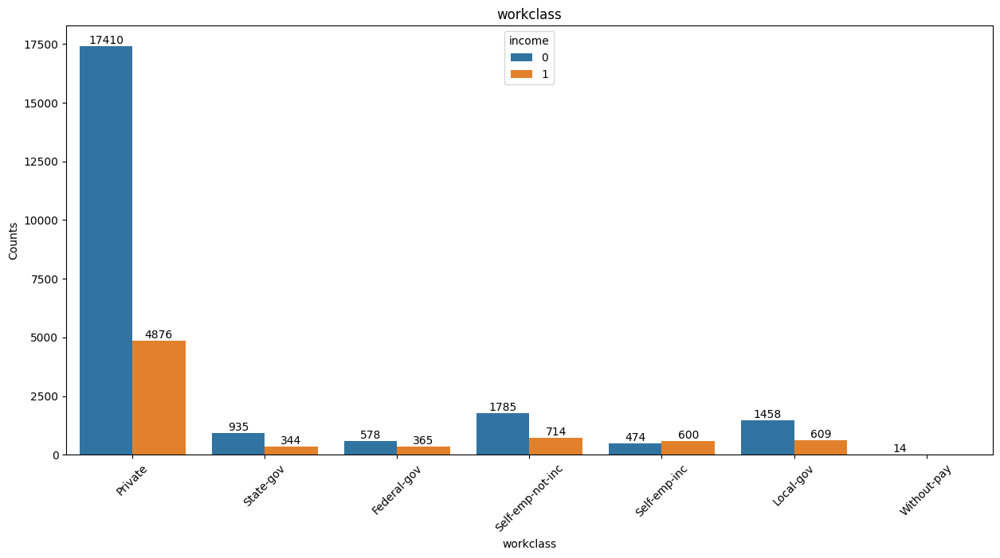

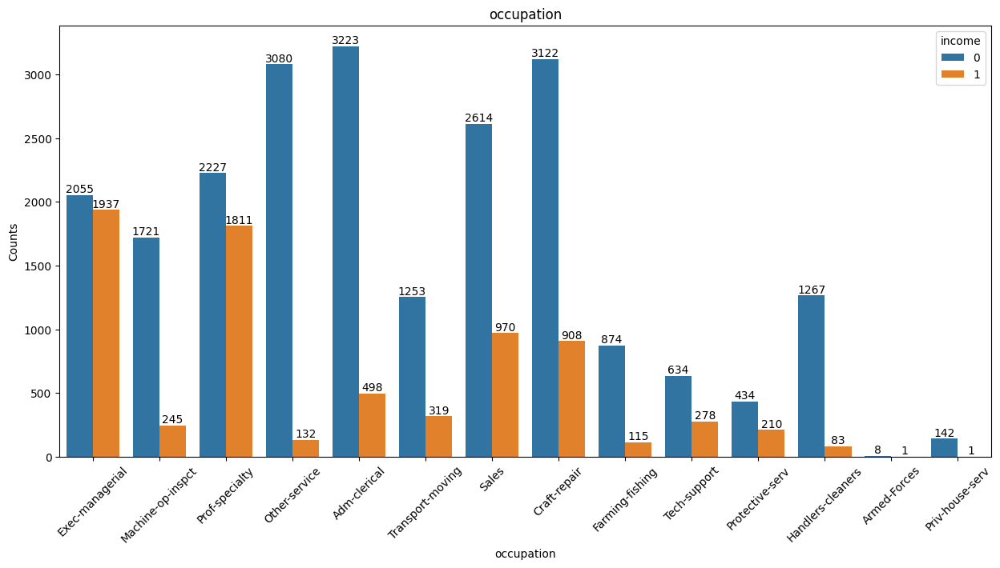

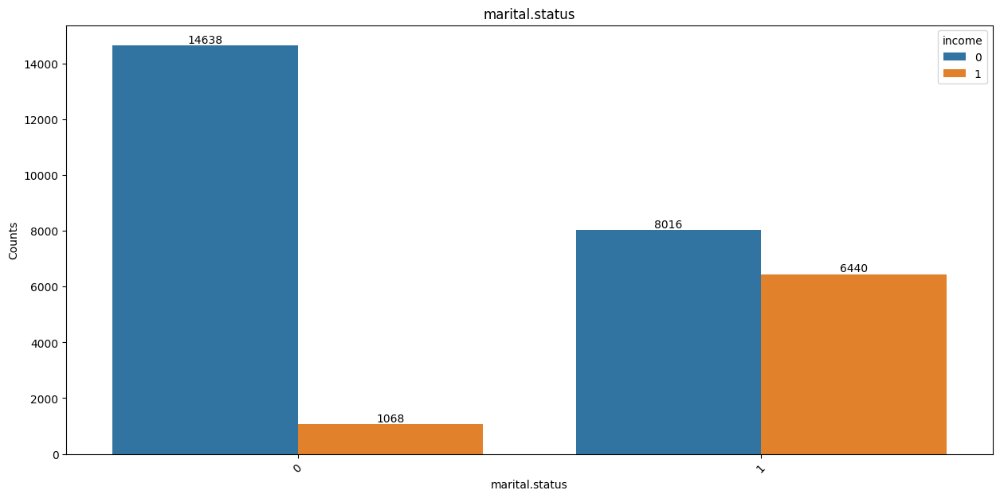

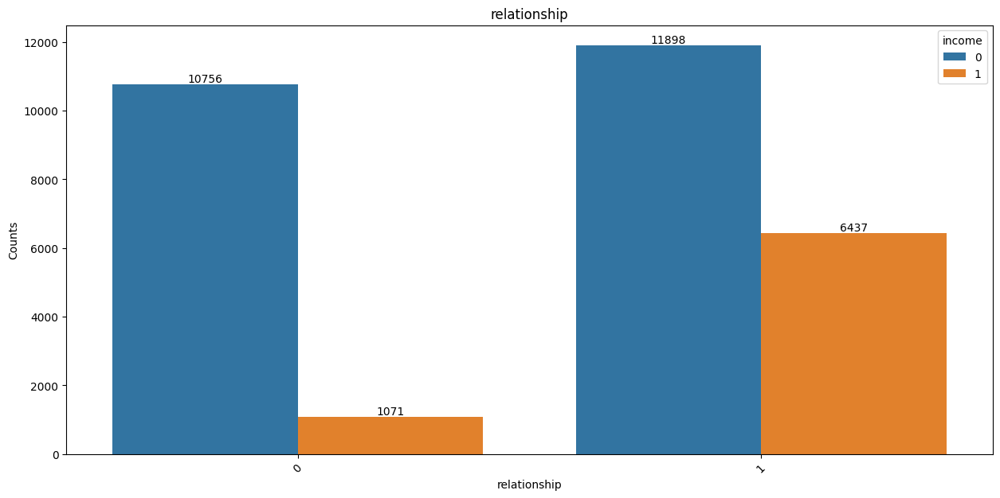

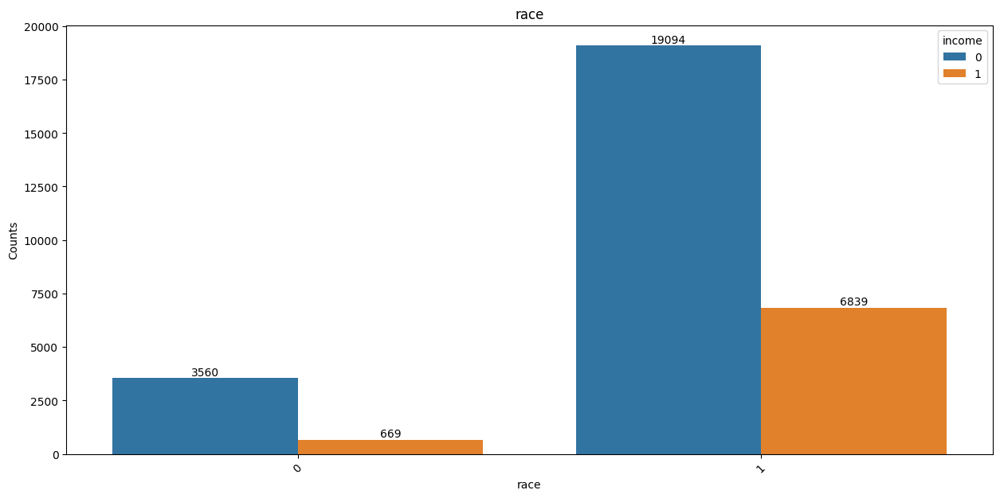

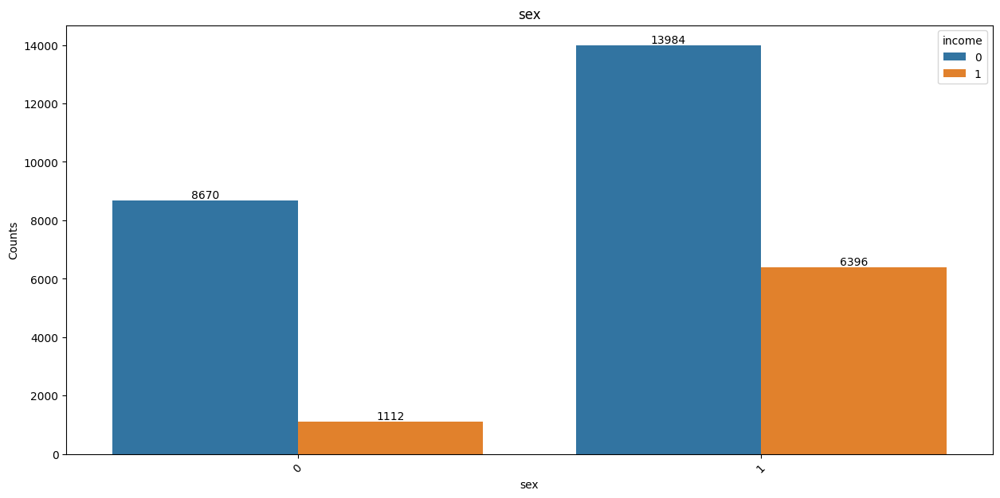

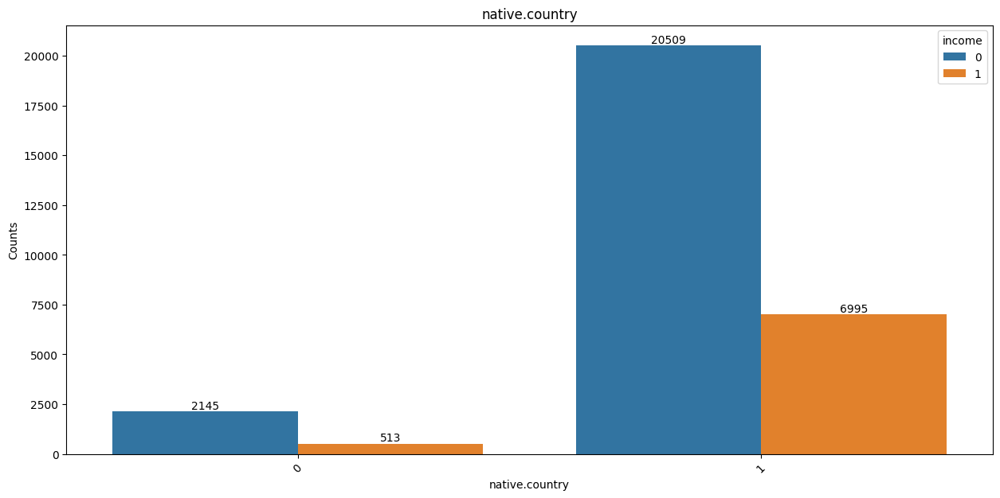

In [51]:
# Kategorik olanlarin bar grafiklerini cizelim;

for i in cat_cols_NEW:
    fig, ax = plt.subplots()
    sns.countplot(ax = ax, data = df, x = df[i], hue = "income")
    plt.xticks(rotation=45)
    ax.set(ylabel='Counts', title=i)
    
    for j in [0,1]:
        ax.bar_label(ax.containers[j])

plt.show()

**YORUM:** 
* Ozel sektorde calisanlarin buyuk cogunlugu yillik 50k'dan az kazaniyor. Bu durum kamuda ve diger alanlarda calisanlarda da benzer sekilde.

* Linsans mezunlarinda 50K'dan az kazananlar ile 50k'dan fazla kazananlar goece birbirine yakin sayida. Master ve doktora mezunlarinda 50K'dan fazla kazananlar daha cok kisi. Prof-school olarak gosterilen tip mezunlari da 50K'nn uzerinde gelire sahipler. 

* Evliligi devam eden (esiyle birlikte yasayan) kisilerde 50K,dan fazla kazanana sayisi diger kisilere gore cok daha fazla. 

* Ecxcellent-managerial (yuksek nitelikli yonetici), professional uzmanlar, satis elemanlari ve hava tasiti tamircileri arasinda da 50K'dan fazla kazanan cok sayida kisi bulunmakta. 

* Esiyle birlikte yasayan kadinlarin erkeklerden daha cogunun yillik 50K ve ustu para kazandigi gorulmektedir. 

* 50K ve ustu kazananlarin buyuk cogunlugunun beyazlar ve ABD vatandaslari oldugu gorulmektedir. Tabi bu sonuc uzerinde; toplam gozlemler icinde beyaz kisilerin ve ABD vatandaslarinin sayisinin fazla olmasinin da etkisi vardir. 

* Erkek ve kadinlarin kendi aralarindaki duruma baktildiginda; 50K ve uzeri kazanma oraninin erkeklerde daha fazla oldugu gorulmektedir. 

###  Numeric Feature Analysis

In [52]:
# Numeric sutunlar icin histogram grafikleri cizelim;

def histPlot(num):
    sns.histplot(data = df, x = num, bins = 50, kde = True)
    print("{} distribution with hist:".format(num))
    plt.show()

age distribution with hist:


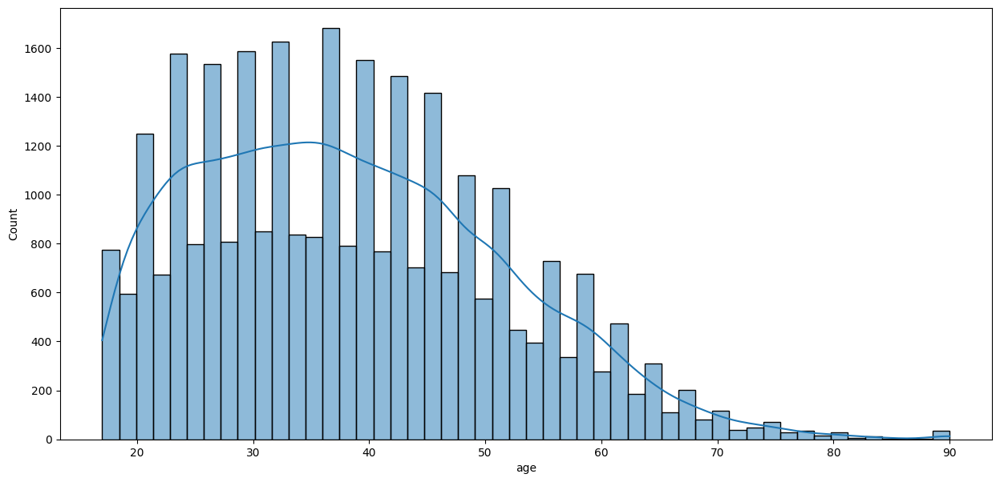

fnlwgt distribution with hist:


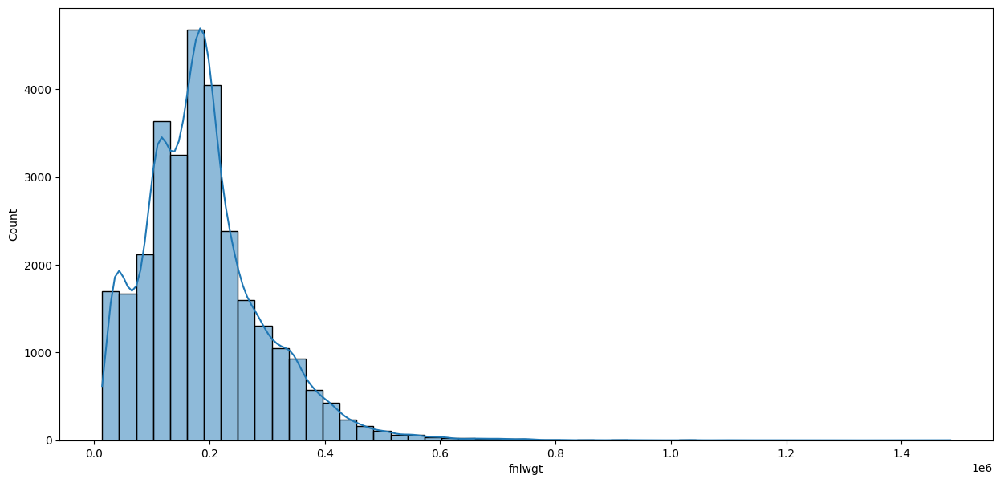

education.num distribution with hist:


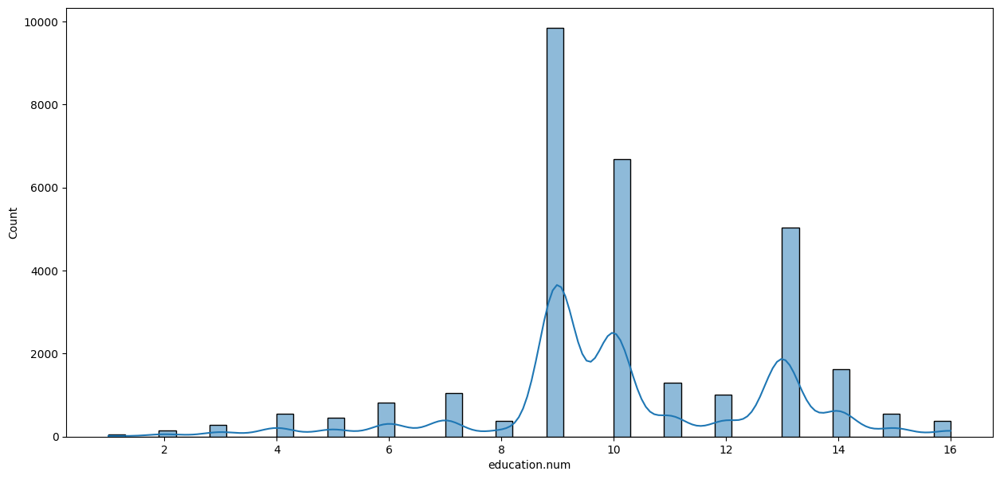

capital.gain distribution with hist:


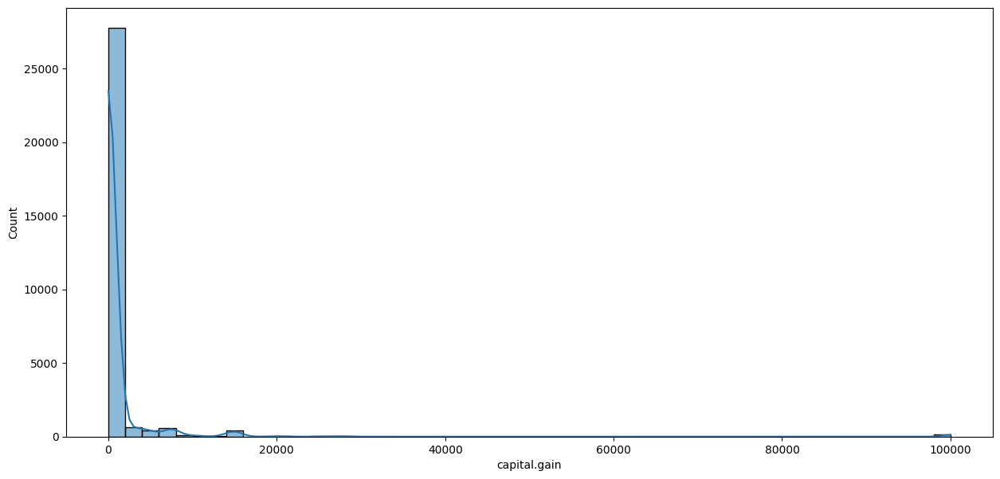

capital.loss distribution with hist:


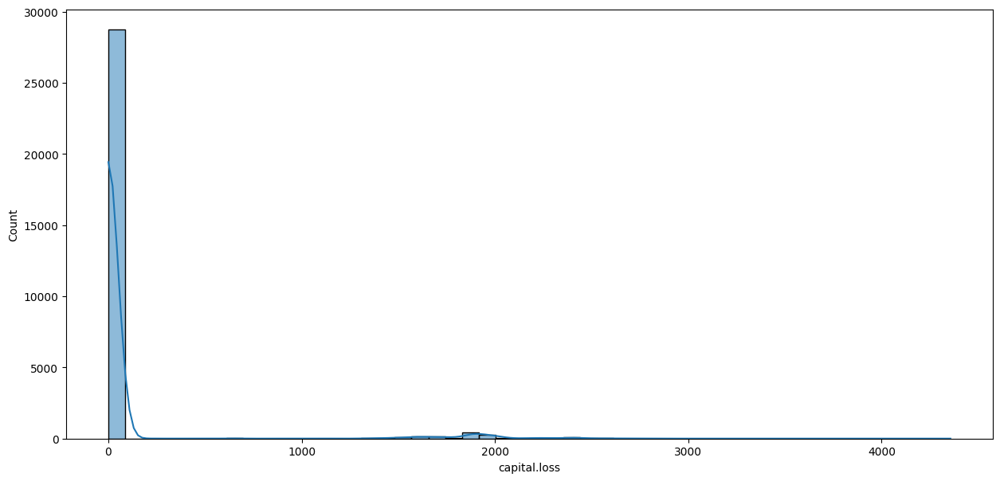

hours.per.week distribution with hist:


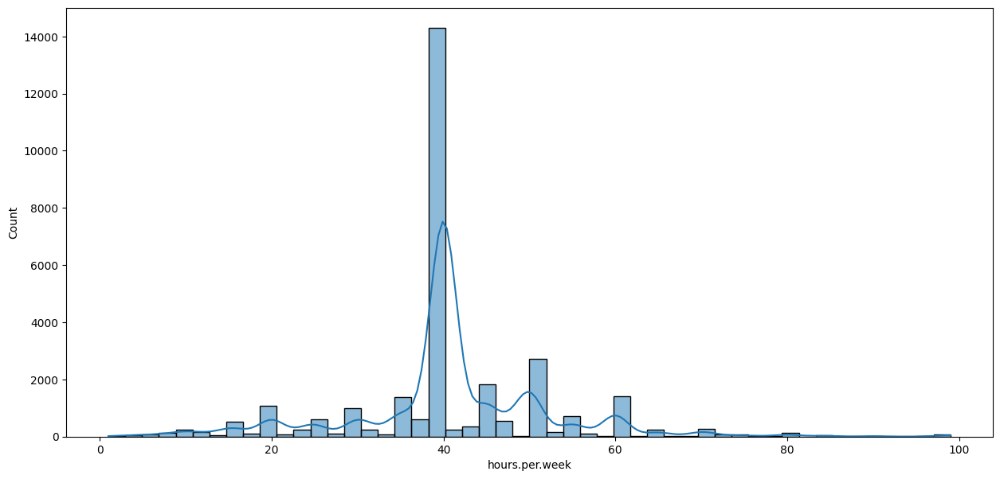

In [53]:
for i in num_cols:
    histPlot(i);

**YORUM:**

* Yaslarin sagdan carpik oldugu, calisanlarin buyuk bolumunun 20-50 yas araliginda oldugu gorulmektedir.  

* Bu kisilerin buyuk bir kisminin liseyi yarida birakmis veya lise mezunu olduklari gorulmektedir. 

* Kisilerin yine buyuk bir bolumu haftada 40 saat cuvarinda calismaktadir. 

### Pairplot

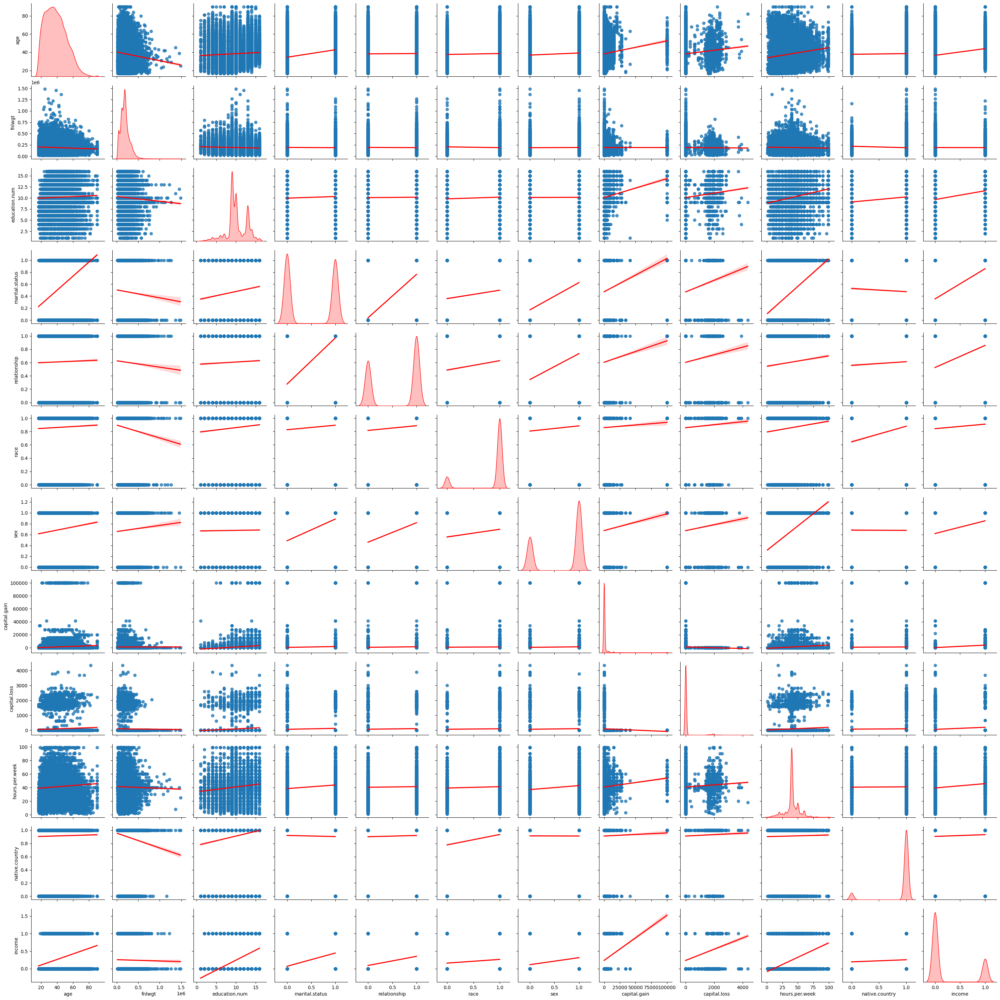

In [54]:
sns.pairplot(df, kind = "reg", diag_kind = "kde", diag_kws={"color":"red"}, plot_kws={"line_kws":{"color":"red"}});

* Yas, egitim, sernaye kazanci ve haftalik calisma sayisi arttikca yillik gelirin de arttigi gorulmektedir. 

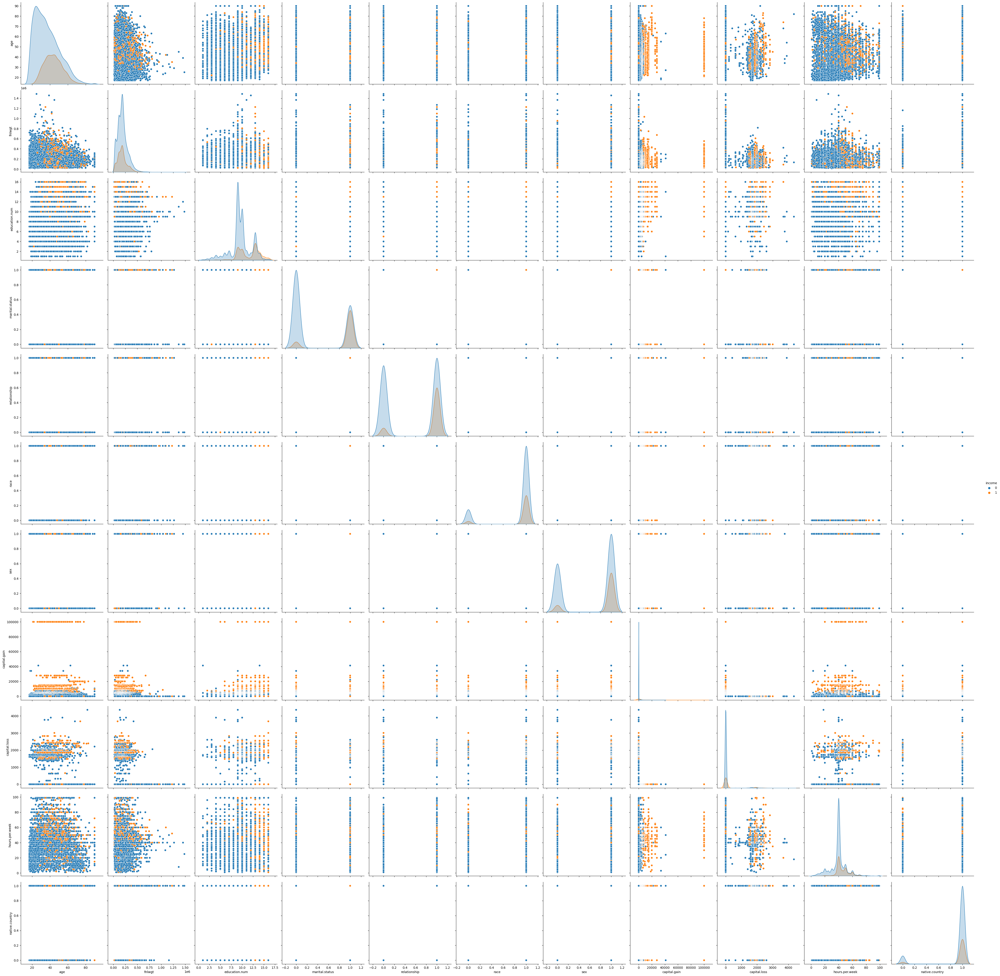

In [55]:
# Pairplot with hue; 

sns.pairplot(data=df, hue="income", height=4, aspect =1);

**YORUM:** Geliri 50K'nin altif=dan olanlar ile 50k'dan fazla olanlara ait yogunluk-dagilim grafileri ust uste cakistigi icin model bu kisileri ayristirmakta zorlanabilecektir.  

### Scatter Plot

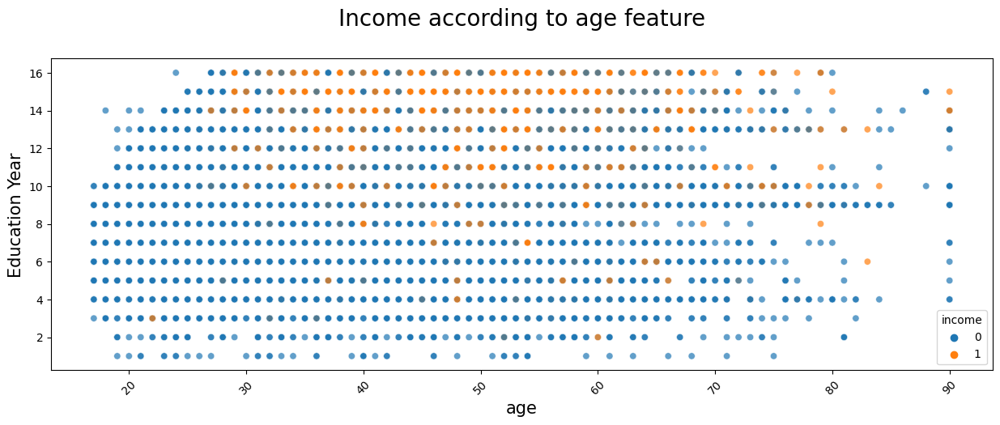

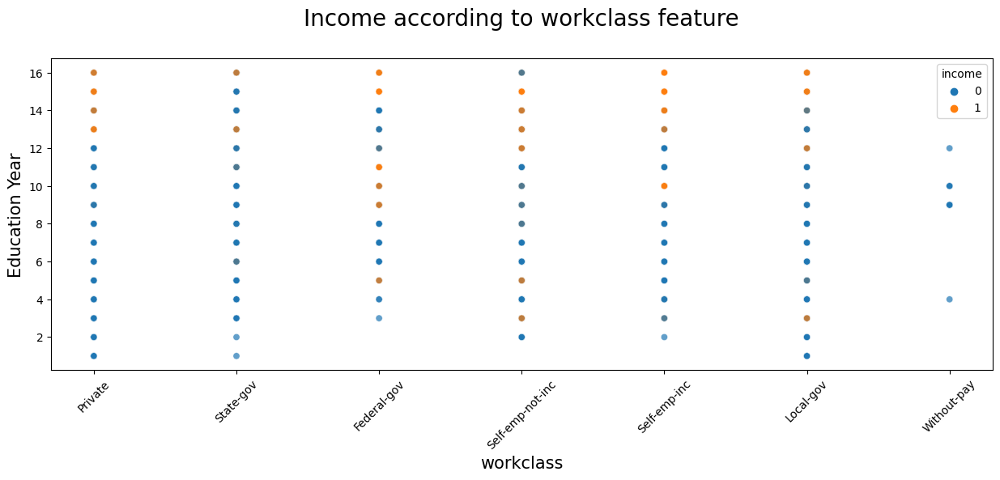

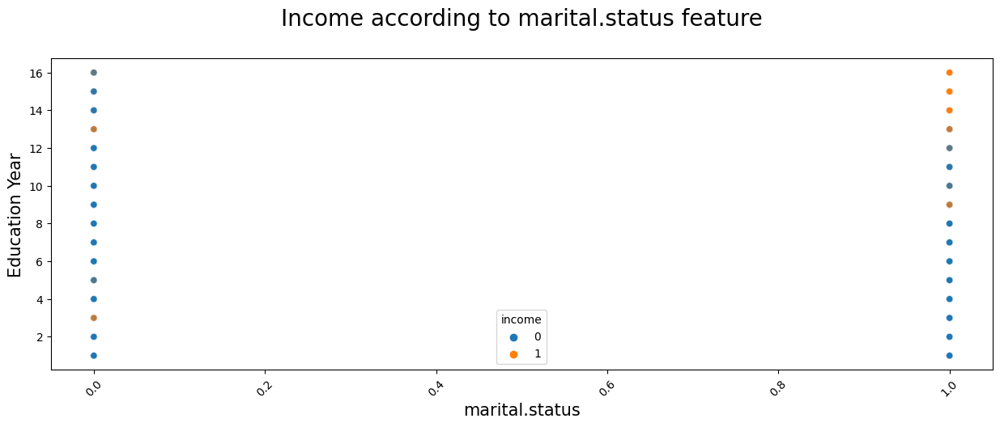

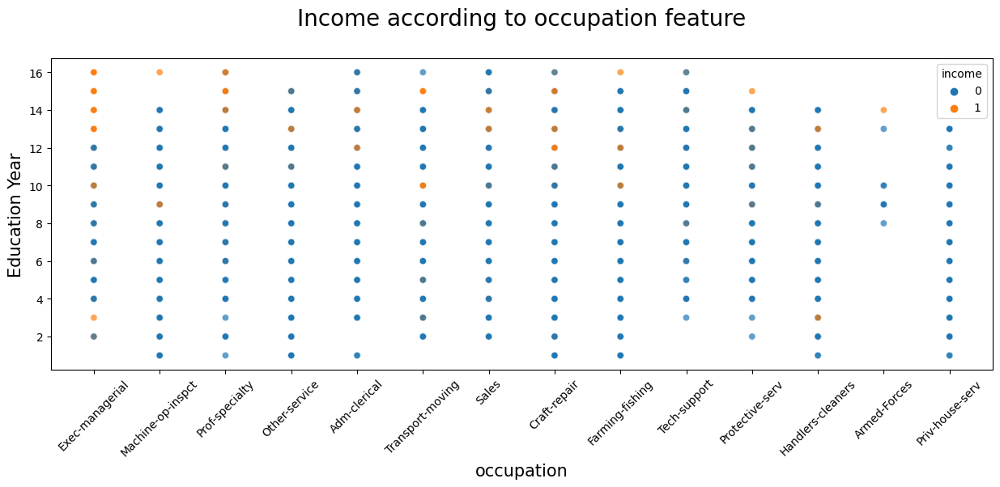

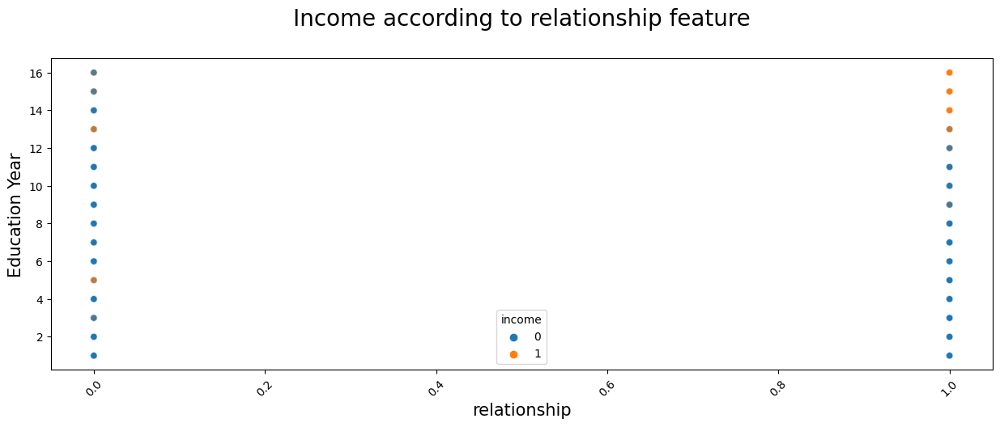

...

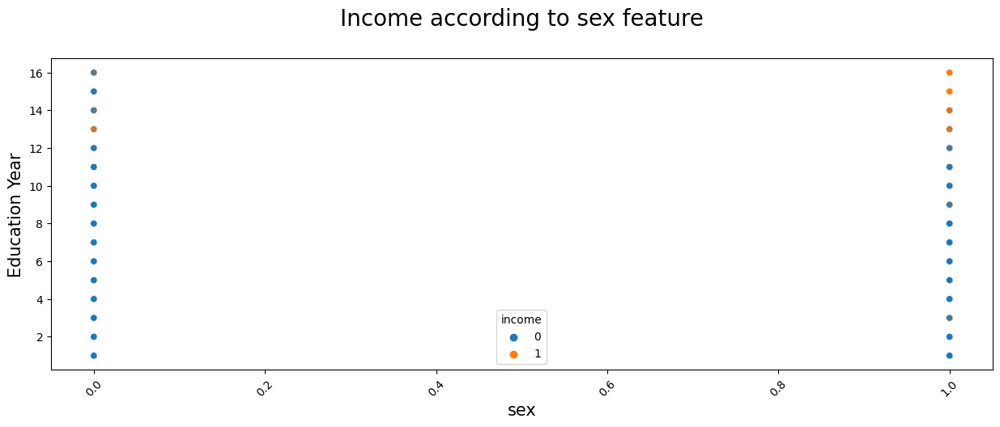

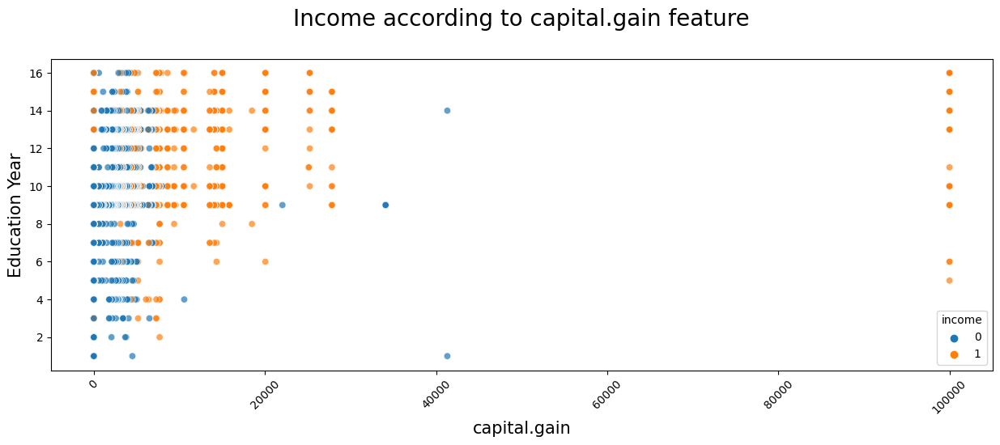

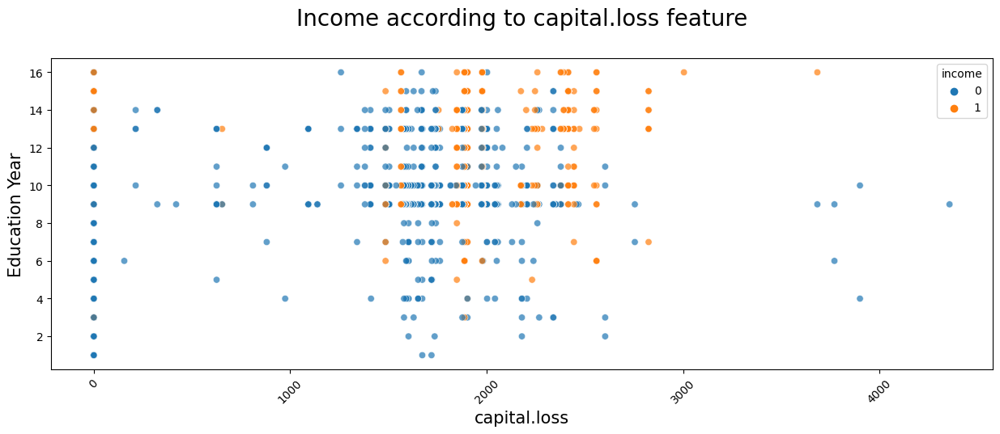

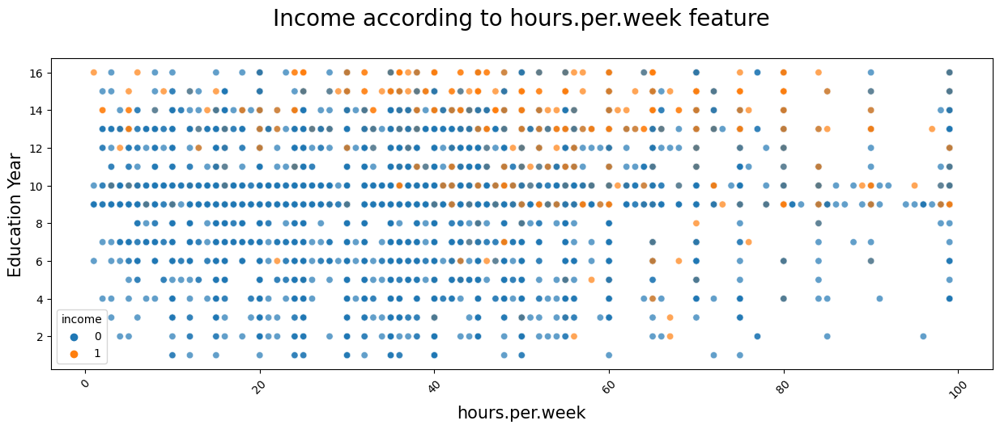

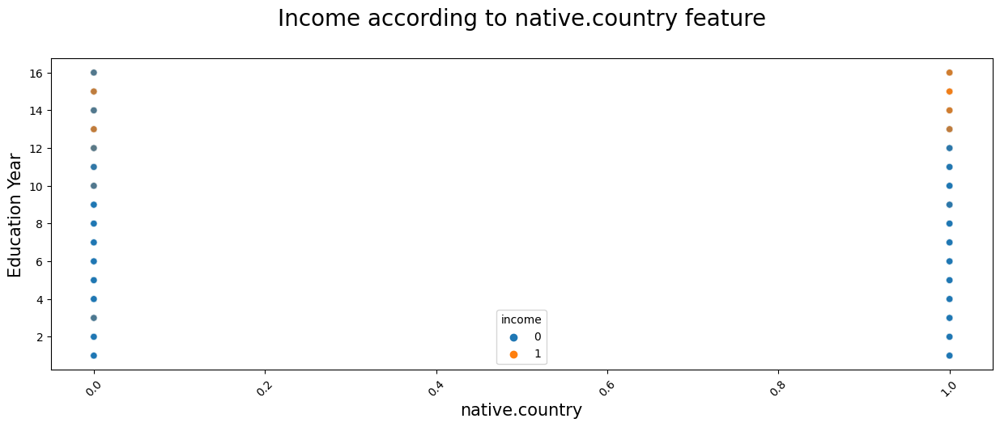

In [56]:
def explore_cat_feature(feature):
    plt.figure(figsize=[15, 5])
    sns.scatterplot(x=feature, y='education.num', hue='income', data=df, alpha=0.7)
    plt.xlabel(feature, fontsize=15)
    plt.xticks(rotation=45)
    plt.ylabel('Education Year', fontsize=15)
    plt.title("Income according to {} feature\n".format(feature), fontsize=20)
    plt.show()

for feature in ['age', 'workclass', 'marital.status',
       'occupation', 'relationship', 'race', 'sex', 'capital.gain',
       'capital.loss', 'hours.per.week', 'native.country']:
        explore_cat_feature(feature)


### Outlier Analysis with Boxplot

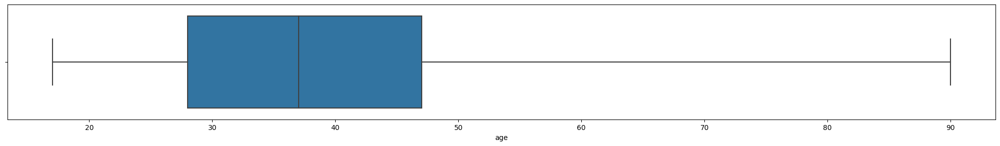

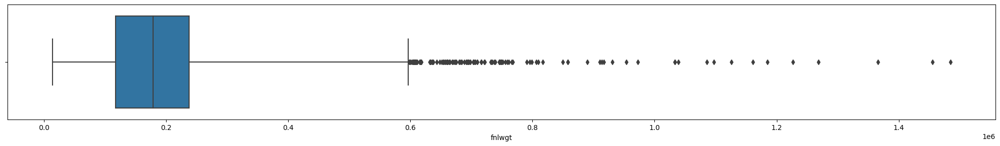

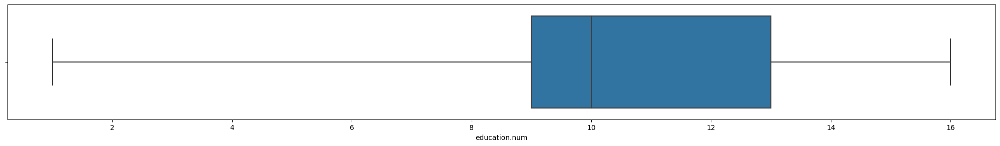

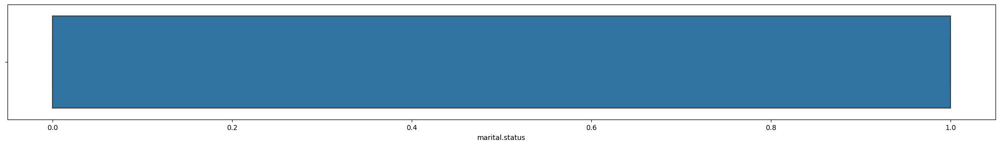

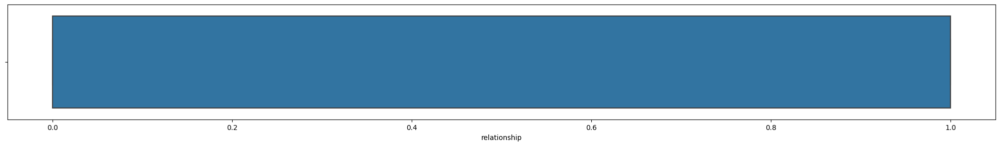

...

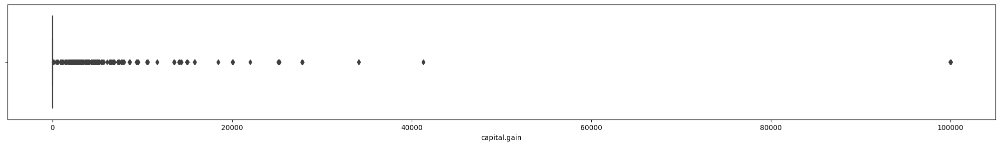

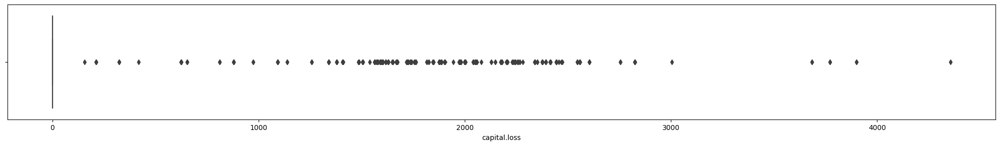

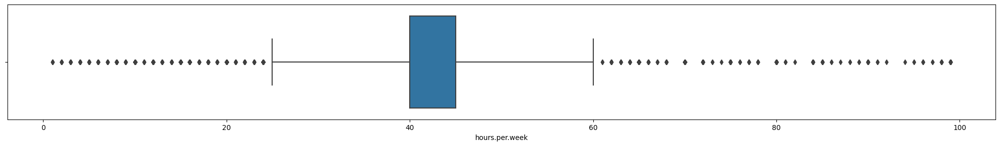

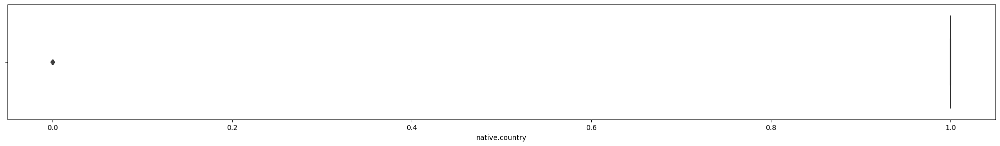

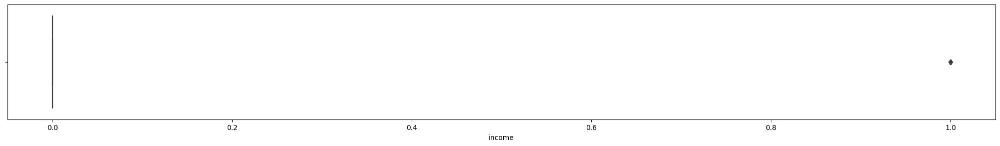

In [57]:
# Let's draw boxplots and histplots for checking distributions of features;
index=0
for feature in df.select_dtypes('number').columns:
    index+=1
    plt.figure(figsize=(40,40))
    plt.subplot((len(df.columns)),2,index)
    sns.boxplot(x=feature,data=df, whis=3) 
        
    plt.tight_layout()
    
    plt.show()

**YORUM:** Haftalik calisma saatinde kucuk degerlerde de yuksek degerlerde de outlier sayilabilecek degerler bulunmakla birlikte, gercek hayatta miras, devlet yardimi vb ile calismadan yasayanlar olabildigi gibi, Elon Musk gibi haftada 120 saat civarinda calisan (Main, 2021) kisiler de bulunmaktadir. Bu nedenle bu verileri atmayacagiz.   

### 3D Graph

In [58]:
%matplotlib inline
#%matplotlib notebook 

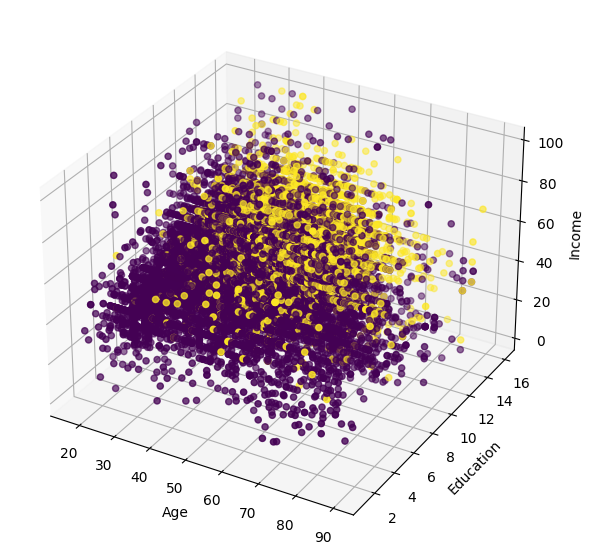

In [59]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D 
import matplotlib.colors as mcolors

# Set colours by classes with ListedColormap
cmap = mcolors.ListedColormap(['red', 'green'])

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df['age'], df['education.num'], df['hours.per.week'], c=df['income'])

ax.set_xlabel('Age')
ax.set_ylabel('Education')
ax.set_zlabel('Income')

plt.show()

In [60]:
fig = px.scatter_3d(df, x='age', y='education.num', z='hours.per.week', color='income')
fig.show()

* Bu 3D grafik gelir durumuna gore kisilerin kolayca ayristirilamayabilecegini gostermektedir. 

In [61]:
fig = px.scatter_3d(df, x='age', y='capital.gain', z='hours.per.week', color='income')
fig.show()

In [62]:
# Bu 3D grafige bakarsak classların aslında birbirinden iyi bir şekilde ayrıldığını ama modelimizin
# hata yapabileceği grift noktaların da olduğunu görüyoruz

# Labelling

* Data setinde object formatinda olan "workclass" ve "occupation" sutunlari bulunmakta. Bunlari dummy variable cevirelim ki program anlasin ve kullanabilsin;

In [258]:
df.head(2)

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
1,82,Private,132870,9,0,Exec-managerial,0,1,0,0,4356,18,1,0
3,54,Private,140359,4,0,Machine-op-inspct,0,1,0,0,3900,40,1,0


## One-Hot Encoding (Get_Dummies)

In [259]:
df=pd.get_dummies(df, drop_first=True)
df.head(5)

,age,fnlwgt,education.num,marital.status,relationship,race,sex,capital.gain,capital.loss,hours.per.week,...,occupation_Farming-fishing,occupation_Handlers-cleaners,occupation_Machine-op-inspct,occupation_Other-service,occupation_Priv-house-serv,occupation_Prof-specialty,occupation_Protective-serv,occupation_Sales,occupation_Tech-support,occupation_Transport-moving
1,82,132870,9,0,0,1,0,0,4356,18,...,0,0,0,0,0,0,0,0,0,0
3,54,140359,4,0,0,1,0,0,3900,40,...,0,0,1,0,0,0,0,0,0,0
4,41,264663,10,0,1,1,0,0,3900,40,...,0,0,0,0,0,1,0,0,0,0
5,34,216864,9,0,0,1,0,0,3770,45,...,0,0,0,1,0,0,0,0,0,0
6,38,150601,6,0,0,1,1,0,3770,40,...,0,0,0,0,0,0,0,0,0,0


In [260]:
df.shape

(30162, 31)

* 13 tane olan sutun sayisi 31'e yukseldi.

## Train-Test Split

In [261]:
X=df.drop(["income"], axis=1)
y=df["income"]

In [262]:
from sklearn.model_selection import train_test_split

In [263]:
df.shape

(30162, 31)

In [264]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, stratify=y, random_state = 42)

In [265]:
X_train.shape

(27145, 30)

In [266]:
X_test.shape

(3017, 30)

* Veri setinde 30162 satir data var. Bunlardan %10'unu test, %90'ini train kismi icin ayirdik.  Train kisminda 2745, test kisminda  3017 gozlem kaldi. 

## Scaling

In [267]:
from sklearn.preprocessing import StandardScaler 

In [268]:
scaler = StandardScaler()

In [269]:
X_train_scaled = scaler.fit_transform(X_train) # Fit and transfer the scaling to X_train.
X_test_scaled = scaler.transform(X_test) # Transfer the scaling to X_test 

# Logistic Regression

##  Logistic Regression without Pipeline

In [75]:
from sklearn.linear_model import LogisticRegression

In [76]:
log_model = LogisticRegression()

In [77]:
# Modeli fit edelim;

log_model.fit(X_train_scaled, y_train) # Training is completed.

LogisticRegression()

In [78]:
# Test datalarini kullanarak test kismindaki kisilerin income'lerini tahmin edelim; 

y_pred = log_model.predict(X_test_scaled)
y_pred 

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

 ## Logistic Regression with Pipeline
 
 Data leakage riskini ortadan kaldirmak icin pipline i kullanalim.

In [79]:
scaler =StandardScaler()

In [80]:
log_model = LogisticRegression()

In [81]:
log_pipe = Pipeline([("scaler",scaler),("log_model",log_model)])

In [82]:
log_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', StandardScaler()),
                ('log_model', LogisticRegression())])

In [83]:
y_pred=log_pipe.predict(X_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0], dtype=int64)

## Proba Degerlerini Bulalim

In [84]:
y_pred_proba = log_pipe.predict_proba(X_test)
y_pred_proba

array([[0.98651829, 0.01348171],
       [0.98156457, 0.01843543],
       [0.53009405, 0.46990595],
       ...,
       [0.79543101, 0.20456899],
       [0.67723383, 0.32276617],
       [0.98097012, 0.01902988]])

In [85]:
# Test kisminda gercek degerler, olasilik degerleri ve tahmin sonucunu bir arada gorelim;

test_data = pd.concat([X_test, y_test], axis=1)
test_data

,age,fnlwgt,education.num,marital.status,relationship,race,sex,capital.gain,capital.loss,hours.per.week,...,occupation_Handlers-cleaners,occupation_Machine-op-inspct,occupation_Other-service,occupation_Priv-house-serv,occupation_Prof-specialty,occupation_Protective-serv,occupation_Sales,occupation_Tech-support,occupation_Transport-moving,income
32295,27,176761,9,0,0,0,1,0,0,40,...,0,0,0,0,0,0,0,0,0,0
18633,22,133833,10,0,1,1,0,0,0,40,...,0,0,0,0,0,0,0,0,0,0
16422,36,171482,10,1,1,1,1,0,0,56,...,0,0,0,0,0,1,0,0,0,1
2732,39,224531,9,1,1,1,1,7298,0,40,...,0,0,0,0,0,0,0,0,0,1
27917,32,113838,10,1,1,1,1,0,0,99,...,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1443,54,188136,13,0,0,1,0,0,1408,38,...,0,0,0,0,0,0,1,0,0,0
12,52,129177,13,0,0,1,0,0,2824,20,...,0,0,1,0,0,0,0,0,0,1
5895,25,169990,9,1,1,1,1,0,0,40,...,0,0,0,0,0,0,1,0,0,0
22022,44,212894,15,0,0,1,1,0,0,55,...,0,0,0,0,1,0,0,0,0,1


In [86]:
test_data["pred_proba"] = y_pred_proba[:,1]
test_data

,age,fnlwgt,education.num,marital.status,relationship,race,sex,capital.gain,capital.loss,hours.per.week,...,occupation_Machine-op-inspct,occupation_Other-service,occupation_Priv-house-serv,occupation_Prof-specialty,occupation_Protective-serv,occupation_Sales,occupation_Tech-support,occupation_Transport-moving,income,pred_proba
32295,27,176761,9,0,0,0,1,0,0,40,...,0,0,0,0,0,0,0,0,0,0.013482
18633,22,133833,10,0,1,1,0,0,0,40,...,0,0,0,0,0,0,0,0,0,0.018435
16422,36,171482,10,1,1,1,1,0,0,56,...,0,0,0,0,1,0,0,0,1,0.469906
2732,39,224531,9,1,1,1,1,7298,0,40,...,0,0,0,0,0,0,0,0,1,0.767961
27917,32,113838,10,1,1,1,1,0,0,99,...,0,0,0,0,1,0,0,0,0,0.736226
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1443,54,188136,13,0,0,1,0,0,1408,38,...,0,0,0,0,0,1,0,0,0,0.256260
12,52,129177,13,0,0,1,0,0,2824,20,...,0,1,0,0,0,0,0,0,1,0.131539
5895,25,169990,9,1,1,1,1,0,0,40,...,0,0,0,0,0,1,0,0,0,0.204569
22022,44,212894,15,0,0,1,1,0,0,55,...,0,0,0,1,0,0,0,0,1,0.322766


In [87]:
test_data["pred"] = y_pred
test_data

,age,fnlwgt,education.num,marital.status,relationship,race,sex,capital.gain,capital.loss,hours.per.week,...,occupation_Other-service,occupation_Priv-house-serv,occupation_Prof-specialty,occupation_Protective-serv,occupation_Sales,occupation_Tech-support,occupation_Transport-moving,income,pred_proba,pred
32295,27,176761,9,0,0,0,1,0,0,40,...,0,0,0,0,0,0,0,0,0.013482,0
18633,22,133833,10,0,1,1,0,0,0,40,...,0,0,0,0,0,0,0,0,0.018435,0
16422,36,171482,10,1,1,1,1,0,0,56,...,0,0,0,1,0,0,0,1,0.469906,0
2732,39,224531,9,1,1,1,1,7298,0,40,...,0,0,0,0,0,0,0,1,0.767961,1
27917,32,113838,10,1,1,1,1,0,0,99,...,0,0,0,1,0,0,0,0,0.736226,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1443,54,188136,13,0,0,1,0,0,1408,38,...,0,0,0,0,1,0,0,0,0.256260,0
12,52,129177,13,0,0,1,0,0,2824,20,...,1,0,0,0,0,0,0,1,0.131539,0
5895,25,169990,9,1,1,1,1,0,0,40,...,0,0,0,0,1,0,0,0,0.204569,0
22022,44,212894,15,0,0,1,1,0,0,55,...,0,0,1,0,0,0,0,1,0.322766,0


In [88]:
test_data.sample(10)

,age,fnlwgt,education.num,marital.status,relationship,race,sex,capital.gain,capital.loss,hours.per.week,...,occupation_Other-service,occupation_Priv-house-serv,occupation_Prof-specialty,occupation_Protective-serv,occupation_Sales,occupation_Tech-support,occupation_Transport-moving,income,pred_proba,pred
19888,22,51362,13,0,0,1,0,0,0,16,...,0,0,0,0,1,0,0,0,0.024917,0
32125,37,126675,9,1,1,1,1,0,0,60,...,0,0,0,0,0,0,0,1,0.098983,0
2523,51,139347,9,1,1,1,0,7688,0,40,...,0,0,0,0,0,0,0,1,0.807907,1
17172,43,284403,12,1,1,0,1,0,0,60,...,0,0,0,0,1,0,0,0,0.625531,1
7497,66,212456,9,0,0,1,1,0,0,20,...,0,0,0,0,0,0,0,0,0.022034,0
16397,44,134120,9,1,1,1,0,0,0,40,...,0,0,0,0,0,0,0,1,0.226252,0
24408,26,456618,9,0,0,1,1,0,0,40,...,1,0,0,0,0,0,0,0,0.008025,0
21616,32,235847,10,0,0,1,0,0,0,50,...,0,0,0,0,0,0,0,0,0.073179,0
8743,18,300379,8,0,1,1,1,0,0,12,...,0,0,0,0,0,0,0,0,0.005280,0
19059,24,449432,8,1,1,1,1,0,0,40,...,0,0,0,0,0,0,0,0,0.152848,0


**YORUM:** 11633 nolu gozlemin 1 (>50K) olan gelirini %78 olasilikla 1 olarak dogru tahmin eden model, 28597 nolu gozllemin 1  (>50K) olan gelirini %28 olasilikla, hatali olarak, 0 diye tahmin etmistir.  

 ## Model Performance

In [89]:
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score
from sklearn.metrics import confusion_matrix, classification_report, plot_confusion_matrix

In [90]:
confusion_matrix(y_test, y_pred) # confusion_matrix

array([[2124,  142],
       [ 302,  449]], dtype=int64)

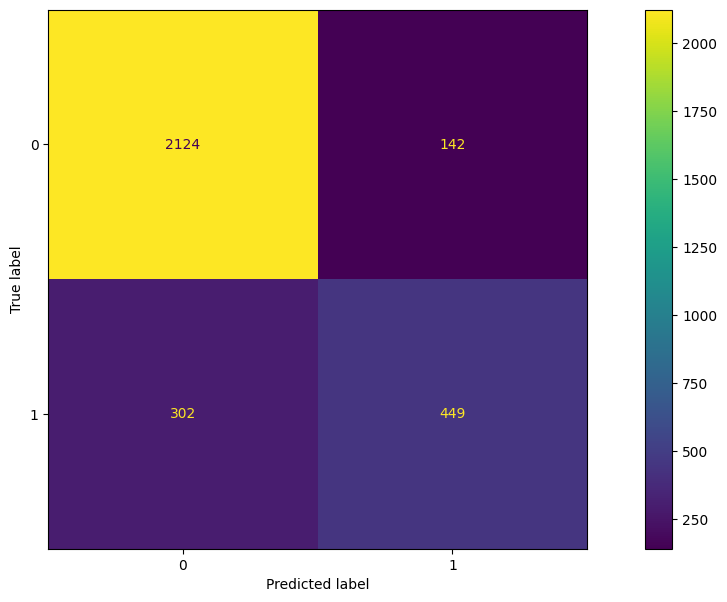

In [91]:
# Confusion matrix ;

plot_confusion_matrix(log_model, X_test_scaled, y_test)  # confusion_matrix visulation 
plt.show()

**YORUM:**  Model 3017 test gozleminden 2573 tanesini dogru, 444 tanesini yanlis bilmistir. Gercekte 1 olan 743 gozlemden 445'ni, gercekte 0 olan 2274 gozlemden 2098 tanesini dogru bilebilmistir. 

In [92]:
# Modelin basari skorlarina bakalim; 
def eval_metric(model, X_train, y_train, X_test, y_test):
    y_train_pred = model.predict(X_train)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    
    print() # For empty rows
    print() # For empty rows
    
    print("Train_Set")
    print(confusion_matrix(y_train, y_train_pred))
    print(classification_report(y_train, y_train_pred))
    
eval_metric(log_model, X_train_scaled, y_train, X_test_scaled, y_test)

Test_Set
[[2124  142]
 [ 302  449]]
              precision    recall  f1-score   support

           0       0.88      0.94      0.91      2266
           1       0.76      0.60      0.67       751

    accuracy                           0.85      3017
   macro avg       0.82      0.77      0.79      3017
weighted avg       0.85      0.85      0.85      3017



Train_Set
[[18923  1465]
 [ 2713  4044]]
              precision    recall  f1-score   support

           0       0.87      0.93      0.90     20388
           1       0.73      0.60      0.66      6757

    accuracy                           0.85     27145
   macro avg       0.80      0.76      0.78     27145
weighted avg       0.84      0.85      0.84     27145



* Model unbalance oldugu icin accuracy degil precision, recall ve f1 skorlarina bakmak gerekir. 

* Train ve test kisimlarina ait sonuclar uyumludur. OVERFIT olmadigi degerlendirilmektedir. 

* Model 0'lari 1'lerden daha iyi tahmin etmis. Bu normal cunlu gozlemlertden %75'i 0, %25'i 1 idi. Biz 1'leri hedeflemis olalim. Precision = 0.76, recall = 0.56, f1 = 0.65 cikti Bunlar biraz dusuk.  

* Cross Validation yaparak sonuclari tekrar inceleyelim;

## Cross Validation

In [93]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_validate

model = LogisticRegression()
scores = cross_validate(model, 
                        X_train_scaled, 
                        y_train, 
                        scoring = ['accuracy', 'precision','recall','f1'], 
                        cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1
1,0.165837,0.011796,0.837569,0.708703,0.590237,0.644068
2,0.157258,0.006842,0.843831,0.750000,0.559172,0.640678
3,0.148821,0.008606,0.855985,0.755835,0.622781,0.682887
4,0.160476,0.006006,0.839779,0.718693,0.585799,0.645477
5,0.200851,0.012742,0.848987,0.745387,0.597633,0.663383
6,0.165738,0.006063,0.846352,0.732496,0.603550,0.661800
7,0.158831,0.008789,0.854458,0.757798,0.610947,0.676495
8,0.154805,0.014402,0.844878,0.726786,0.602963,0.659109
9,0.133154,0.010761,0.840088,0.710297,0.602963,0.652244
10,0.177650,0.008625,0.841194,0.721818,0.588148,0.648163


In [94]:
df_scores.mean()[2:]

test_accuracy     0.845312
test_precision    0.732781
test_recall       0.596419
test_f1           0.657430
dtype: float64

* CV deki skorlar test datasindaki sonuclarla uyumludur. Modelde OVERFIT yoktur. Belki 1 lerinbelirlenmesinde UNDERFIT oldugu dusunulebilir. 

## GridSearchCV

Logostoc Regresyon modleine ait optimum hyper parametreleri bularak en iyi sonuca ulasabilmek icin GridSearch yapalim. 

GridSearch icinde CV yi de kullanalim.

In [95]:
from sklearn.model_selection import GridSearchCV

In [96]:
log_model = LogisticRegression(max_iter=10000, 
                               random_state =42, 
                               class_weight='balanced')

penalty = ["l1", "l2"]
C = np.logspace(-1, 5, 20)      
param_grid = {
    "solver": ['liblinear', 'saga'],
    "penalty": penalty,
     "C" : C
}

grid_model = GridSearchCV(log_model,
                          param_grid = param_grid,
                          cv=10,
                          scoring='f1'                         
                         )

#unbalance sorunsalini cozebilmek icin log_modele      class_weight='balanced'    kismini ekledim.
# Unbalance data oldugu icin best skor olarak accuracy degil, f1 i hedeflemesini iostedim. 

In [97]:
grid_model.fit(X_train_scaled, y_train)# Modeli fit edelim

GridSearchCV(cv=10,
             estimator=LogisticRegression(class_weight='balanced',
                                          max_iter=10000, random_state=42),
             param_grid={'C': array([1.00000000e-01, 2.06913808e-01, 4.28133240e-01, 8.85866790e-01,
       1.83298071e+00, 3.79269019e+00, 7.84759970e+00, 1.62377674e+01,
       3.35981829e+01, 6.95192796e+01, 1.43844989e+02, 2.97635144e+02,
       6.15848211e+02, 1.27427499e+03, 2.63665090e+03, 5.45559478e+03,
       1.12883789e+04, 2.33572147e+04, 4.83293024e+04, 1.00000000e+05]),
                         'penalty': ['l1', 'l2'],
                         'solver': ['liblinear', 'saga']},
             scoring='f1')

In [98]:
grid_model.best_params_

{'C': 0.20691380811147897, 'penalty': 'l1', 'solver': 'saga'}

In [99]:
grid_model.best_score_  

0.6809135490550482

* Modelin f1 skoru 0.68 olup, gorece dusuktur. 

* Bu dusuklugun arkasinda unbalance data yapisinin oldugu dusuncesinden hareketle ROC ve AUC skorlarina da bakalim. 

## ROC - AUC

In [100]:
from sklearn.metrics import plot_roc_curve, plot_precision_recall_curve
from sklearn.metrics import roc_auc_score, auc, roc_curve

In [101]:
from sklearn.linear_model import LogisticRegression # We need it in ROC curve plot 

In [102]:
log_model = LogisticRegression()

In [103]:
log_model.fit(X_train_scaled,y_train)

LogisticRegression()

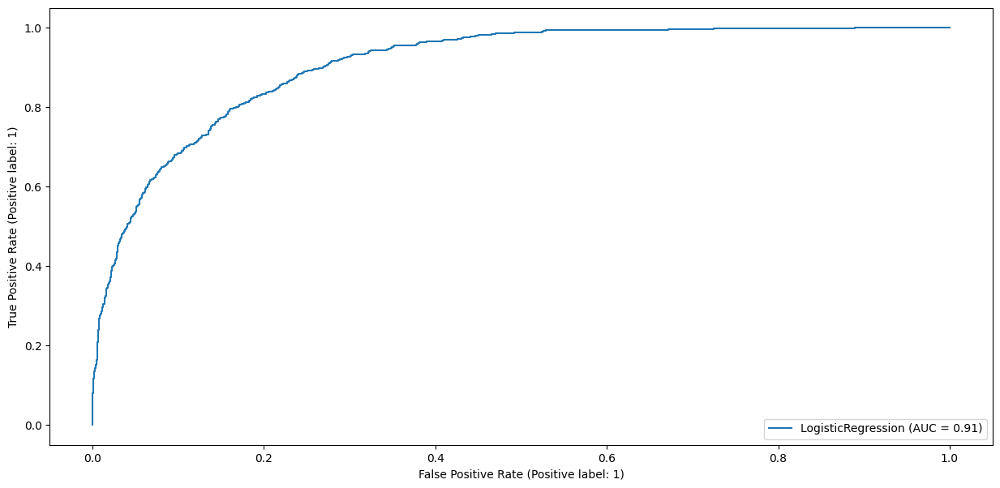

In [104]:
plot_roc_curve(log_model, X_test_scaled, y_test);

In [105]:
roc_auc_score(y_test, y_pred_proba[:,1])

0.906564122211867

* Modelin ROC-AUC soru 0.90 olup, aslinda modelin basarili oldugu anlasilmaktadir. 

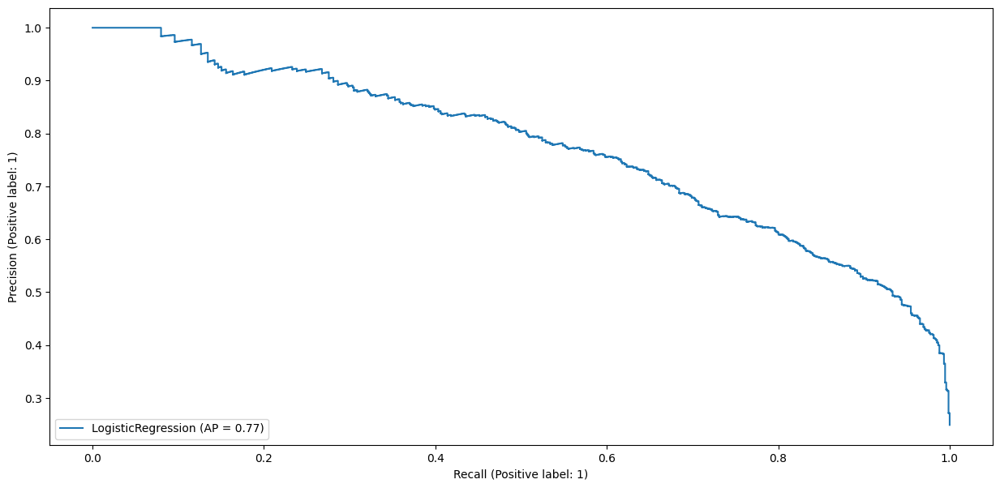

In [106]:
# Datanin unbalance olmasi nedeniyle Precision - Recall a da bakmak yararli olacaktir;

plot_precision_recall_curve(log_model, X_test_scaled, y_test);

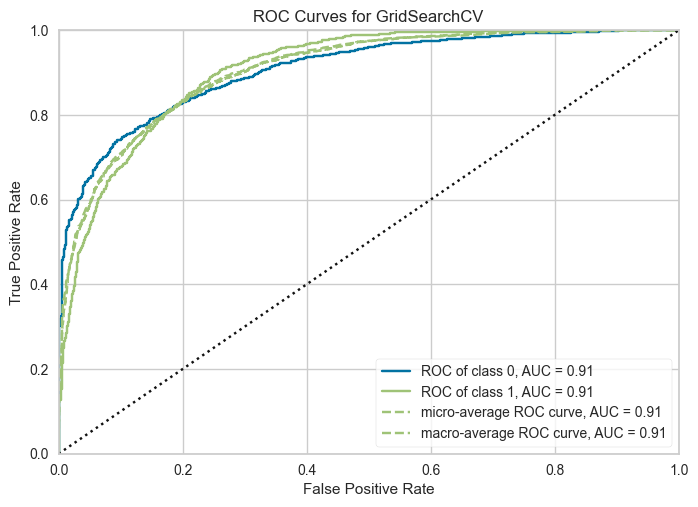

In [107]:
from yellowbrick.classifier import ROCAUC

model = grid_model
visualizer = ROCAUC(model)
visualizer.fit(X_train_scaled, y_train)        
visualizer.score(X_test_scaled, y_test)        
visualizer.show();

* Bu grafige gore de modelin skorlari 0.90 olup, model basarili kabul edilebilir. 

## SMOTE

In [108]:
df.shape # Datanin normal hali

(30162, 31)

In [109]:
# Get Dummy

df=pd.get_dummies(df, drop_first=True)
df.head(5)

,age,fnlwgt,education.num,marital.status,relationship,race,sex,capital.gain,capital.loss,hours.per.week,...,occupation_Farming-fishing,occupation_Handlers-cleaners,occupation_Machine-op-inspct,occupation_Other-service,occupation_Priv-house-serv,occupation_Prof-specialty,occupation_Protective-serv,occupation_Sales,occupation_Tech-support,occupation_Transport-moving
1,82,132870,9,0,0,1,0,0,4356,18,...,0,0,0,0,0,0,0,0,0,0
3,54,140359,4,0,0,1,0,0,3900,40,...,0,0,1,0,0,0,0,0,0,0
4,41,264663,10,0,1,1,0,0,3900,40,...,0,0,0,0,0,1,0,0,0,0
5,34,216864,9,0,0,1,0,0,3770,45,...,0,0,0,1,0,0,0,0,0,0
6,38,150601,6,0,0,1,1,0,3770,40,...,0,0,0,0,0,0,0,0,0,0


In [110]:
df.shape # Datanin get_dummy sonrasi sekli

(30162, 31)

In [111]:
X=df.drop(["income"], axis=1)
y=df["income"]

In [112]:
from sklearn.model_selection import train_test_split

In [113]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, stratify=y, random_state = 42)

In [114]:
#Scaling

In [115]:
from sklearn.preprocessing import StandardScaler 

In [116]:
scaler = StandardScaler()

In [117]:
X_train_scaled = scaler.fit_transform(X_train) # Fit and transfer the scaling to X_train.
X_test_scaled = scaler.transform(X_test) # Transfer the scaling to X_test 

In [118]:
X_train_scaled.shape

(27145, 30)

In [119]:
X_test_scaled.shape

(3017, 30)

### SMOTE with Oversampling

Az olan gozlem sayisini artirarak cok olana yaklastirma islemi yapiyoruz. 

In [270]:
print("Before OverSampling, counts of label '1': {}".format(sum(y_train == 1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train == 0)))

# import SMOTE module from imblearn library
# pip install imblearn (if you don't have imblearn in your system)

from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state = 42)

X_train_res, y_train_res = sm.fit_resample(X_train_scaled, y_train) 
#y_train.ravel

print("After OverSampling, counts of label '1': {}".format(sum(y_train_res == 1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res == 0)))


Before OverSampling, counts of label '1': 6757
Before OverSampling, counts of label '0': 20388 

After OverSampling, counts of label '1': 20388
After OverSampling, counts of label '0': 20388


** SMOTE islemi oncesinde train setinde 6757 tane 1, 20388 tane 0 varken, SMOTE islemi sayesinde 1 sayisi da 20688'e yukseldi ve data balanced hale geldi. 

In [121]:
# Prediction and Recall

lr1 = LogisticRegression(random_state = 42)
lr1.fit(X_train_res, y_train_res)
predictions = lr1.predict(X_test_scaled)
  
# print classification report
print(classification_report(y_test, predictions))

              precision    recall  f1-score   support

           0       0.93      0.81      0.87      2266
           1       0.59      0.82      0.69       751

    accuracy                           0.82      3017
   macro avg       0.76      0.82      0.78      3017
weighted avg       0.85      0.82      0.82      3017



SMOTE islemi olmaksizin, dengesiz veri seti ile elde ettigimiz sonuc bu idi; 

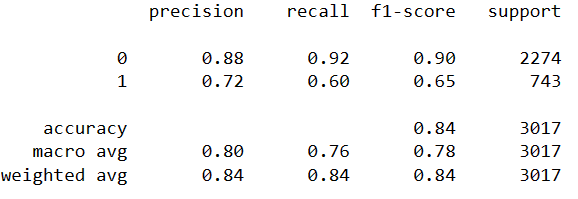

**SONUCLARI KARSILASTIRALIM:**  SMOTE islemi ile veri seti baalnced hale getirildikten sonra recall 0.60'tan 0.82'ye, f1 0.65'ten 0.69'a yukseldi. Yani SMOPTE islemi az da olsa modelin performansini olumlu yonde etkiledi. 

### SMOTE with Undersampling

Cok olan gozlem sayisini azaltarak az olana yaklastirma islemi yapiyoruz.  

In [161]:
print("Before UnderSampling, counts of label '1': {}".format(sum(y_train == 1)))
print("Before UnderSampling, counts of label '0': {} \n".format(sum(y_train == 0)))

# import SMOTE module from imblearn library
# pip install imblearn (if you don't have imblearn in your system)

from imblearn.under_sampling import NearMiss
nr = NearMiss()

X_train_miss, y_train_miss = nr.fit_resample(X_train_scaled, y_train) 
#y_train.ravel

print("After UnderSampling, counts of label '1': {}".format(sum(y_train_miss == 1)))
print("After UnderSampling, counts of label '0': {}".format(sum(y_train_miss == 0)))


Before UnderSampling, counts of label '1': 6757
Before UnderSampling, counts of label '0': 20388 

After UnderSampling, counts of label '1': 6757
After UnderSampling, counts of label '0': 6757


** SMOTE islemi oncesinde train setinde 6757 tane 1, 20388 tane 0 varken, SMOTE islemi sayesinde 0 sayisi azaltilarak 6757'ye dusuruldu. 

In [123]:
# Prediction and Recall

lr2 = LogisticRegression(random_state = 42)
lr2.fit(X_train_miss, y_train_miss)
predictions2 = lr2.predict(X_test_scaled)
  
# print classification report
print(classification_report(y_test, predictions2))

              precision    recall  f1-score   support

           0       0.90      0.85      0.87      2266
           1       0.61      0.71      0.66       751

    accuracy                           0.82      3017
   macro avg       0.76      0.78      0.77      3017
weighted avg       0.83      0.82      0.82      3017



SMOTE oversampling'de elde edilen sonuc;
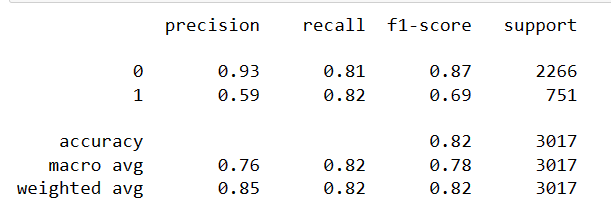


SMOTE islemi olmaksizin, dengesiz veri seti ile elde ettigimiz sonuc bu idi; 
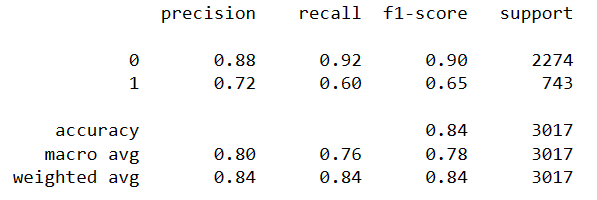


**KARSILASTIRMA:** Bu sonuclara gore eniyi skorlar; oversampling yapilmis SMOTE yontemi ile artirilmis verilerle yapilan analize aittir. Dolayisiyla SMOTE_oversampling islemi yararli ve basarili olmustur. Bu nedenle bundan sonraki analizlerde SMOTE_oversampling yontemiyle elde edilen veriler kullanilacaktir.   

# K-Nearest Neighbors (KNN) Classification


SMOTE_oversampling yontemiyle elde edilen veriler kullanilarak devam edilmektedir. 

## Modelling

In [271]:
from sklearn.neighbors import KNeighborsClassifier

In [272]:
knn_model = KNeighborsClassifier(n_neighbors=5)

In [273]:
knn_model.fit(X_train_res, y_train_res)  # res ler SMOTE_oversampling yontemindeki sampling ifdesinden gelmektedir.       

KNeighborsClassifier()

In [274]:
y_pred = knn_model.predict(X_test_scaled)
y_pred

array([0, 0, 1, ..., 0, 1, 0], dtype=int64)

In [275]:
# Karari hangi % olasilikla verdigini gorebilmek icin yaptik.

y_pred_proba = knn_model.predict_proba(X_test_scaled)

In [276]:
my_dict = {"Actual": y_test, "Pred":y_pred, "Proba_1":y_pred_proba[:,1], "Proba_0":y_pred_proba[:,0]}

In [277]:
pd.DataFrame.from_dict(my_dict).sample(10)

,Actual,Pred,Proba_1,Proba_0
10549,1,1,1.0,0.0
2887,1,1,0.6,0.4
18468,0,0,0.0,1.0
23201,0,1,0.8,0.2
15936,0,0,0.2,0.8
15314,0,0,0.0,1.0
20421,0,0,0.0,1.0
13964,1,1,0.6,0.4
6912,0,1,1.0,0.0
16027,0,0,0.0,1.0


**YORUM:** 2760 index numarasina sahip gozlem (kisi) 50K'dan fazla gelire sahipmis ve model de %80 olasilikla buna 50k'dan fazla geliri var demis. 

20538 index numarasina sahip gozlem (kisi) 50K'dan az gelire sahipmis ve model de %60 olasilikla buna 50k'dan az geliri var demis. 

12729 index numarasina sahip gozlemin (kisinin) geliri 50K'dan fazla olmasina ragmen, model  %100 olasilikla buna 50k'dan az geliri var demis ve hata yapmis. 

## Model Performance 

In [278]:
from sklearn.metrics import confusion_matrix, classification_report, plot_confusion_matrix

In [279]:
confusion_matrix(y_test, y_pred)

array([[1848,  418],
       [ 167,  584]], dtype=int64)

In [280]:
# For default settings of figures; 

plt.rcParams.update(plt.rcParamsDefault)

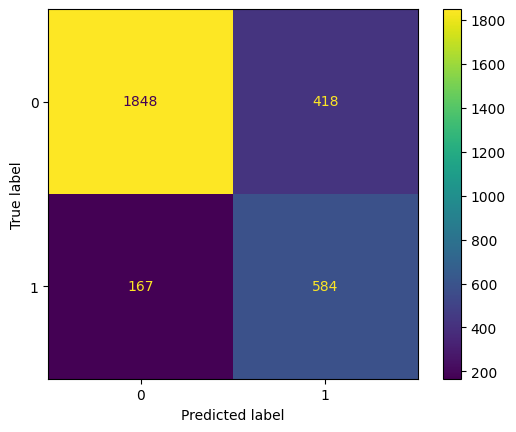

In [281]:
plot_confusion_matrix(knn_model, X_test_scaled, y_test)
plt.show()

In [171]:
# Bular ILKEL (temel, ilk) scorlar oluyor. 
# Bu sonclar k=5 default yontemine gore geliyor. 

print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[1848  418]
 [ 167  584]]
              precision    recall  f1-score   support

           0       0.92      0.82      0.86      2266
           1       0.58      0.78      0.67       751

    accuracy                           0.81      3017
   macro avg       0.75      0.80      0.76      3017
weighted avg       0.83      0.81      0.81      3017



**YORUM:** Simdi traindatasi "**balance**" data olsa bile test datasinda dengesizlik devam ettigi icin **f1*score**'e bakmak gerekir. 

Ilkel analizde f1-score = 0.67.  

## Elbow Method for Choosing Reasonable K Values

In [172]:
from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

In [173]:
test_error_rates = []
train_error_rates = []

for k in range(1,30):
    knn_model = KNeighborsClassifier(n_neighbors=k)
    knn_model.fit(X_train_res,y_train_res) 
   
    y_pred_test = knn_model.predict(X_test_scaled)
    y_pred_train = knn_model.predict(X_train_res)
    
    test_error = 1 - accuracy_score(y_test,y_pred_test)
    test_error_rates.append(test_error)
    
    train_error = 1 - accuracy_score(y_train_res, y_pred_train)
    train_error_rates.append(train_error)

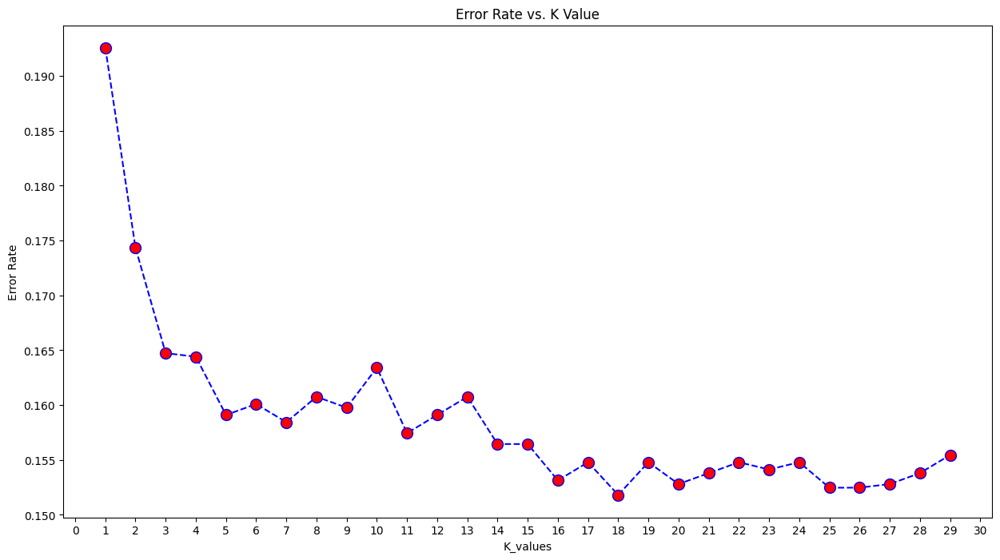

In [224]:
plt.figure(figsize=(15,8))
plt.plot(range(1,30), test_error_rates, color='blue', linestyle='--', marker='o',
         markerfacecolor='red', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K_values')
plt.ylabel('Error Rate')

plt.xticks(range(0, 31))
plt.show()

**YORUM:** Bu grafige gore 18, 16, 20, 11, 6 veya 5 optimum K degeri olmaya adaydir. Bu K degerleri icin skorlari alalim.

## Scores by Various K Values

In [174]:
def eval_metric(model, X_train_res, y_train_res, X_test, y_test):
    y_train_pred = model.predict(X_train_res)
    y_pred = model.predict(X_test)
    
    print("Test_Set\n")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set\n")
    print(confusion_matrix(y_train_res, y_train_pred))
    print(classification_report(y_train_res, y_train_pred))

In [178]:
# k = 18

knn = KNeighborsClassifier(n_neighbors=18)

knn.fit(X_train_scaled,y_train)
print('WITH K=18\n')
eval_metric(knn, X_train_res, y_train_res, X_test_scaled, y_test)

WITH K=18

Test_Set

[[2138  128]
 [ 330  421]]
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      2266
           1       0.77      0.56      0.65       751

    accuracy                           0.85      3017
   macro avg       0.82      0.75      0.78      3017
weighted avg       0.84      0.85      0.84      3017


Train_Set

[[19129  1259]
 [ 8555 11833]]
              precision    recall  f1-score   support

           0       0.69      0.94      0.80     20388
           1       0.90      0.58      0.71     20388

    accuracy                           0.76     40776
   macro avg       0.80      0.76      0.75     40776
weighted avg       0.80      0.76      0.75     40776



In [177]:
# k=16

knn = KNeighborsClassifier(n_neighbors=16)

knn.fit(X_train_scaled,y_train)
print('WITH K=16\n')
eval_metric(knn, X_train_res, y_train_res, X_test_scaled, y_test)

WITH K=16

Test_Set

[[2122  144]
 [ 341  410]]
              precision    recall  f1-score   support

           0       0.86      0.94      0.90      2266
           1       0.74      0.55      0.63       751

    accuracy                           0.84      3017
   macro avg       0.80      0.74      0.76      3017
weighted avg       0.83      0.84      0.83      3017


Train_Set

[[19380  1008]
 [ 7930 12458]]
              precision    recall  f1-score   support

           0       0.71      0.95      0.81     20388
           1       0.93      0.61      0.74     20388

    accuracy                           0.78     40776
   macro avg       0.82      0.78      0.77     40776
weighted avg       0.82      0.78      0.77     40776



In [179]:
# k=20;

knn = KNeighborsClassifier(n_neighbors=20)

knn.fit(X_train_scaled,y_train)
print('WITH K=20\n')
eval_metric(knn, X_train_res, y_train_res, X_test_scaled, y_test)

WITH K=20

Test_Set

[[2134  132]
 [ 329  422]]
              precision    recall  f1-score   support

           0       0.87      0.94      0.90      2266
           1       0.76      0.56      0.65       751

    accuracy                           0.85      3017
   macro avg       0.81      0.75      0.77      3017
weighted avg       0.84      0.85      0.84      3017


Train_Set

[[19109  1279]
 [ 8581 11807]]
              precision    recall  f1-score   support

           0       0.69      0.94      0.79     20388
           1       0.90      0.58      0.71     20388

    accuracy                           0.76     40776
   macro avg       0.80      0.76      0.75     40776
weighted avg       0.80      0.76      0.75     40776



In [180]:
# k=11;

knn = KNeighborsClassifier(n_neighbors=11)

knn.fit(X_train_scaled,y_train)
print('WITH K=11\n')
eval_metric(knn, X_train_res, y_train_res, X_test_scaled, y_test)

WITH K=11

Test_Set

[[2095  171]
 [ 304  447]]
              precision    recall  f1-score   support

           0       0.87      0.92      0.90      2266
           1       0.72      0.60      0.65       751

    accuracy                           0.84      3017
   macro avg       0.80      0.76      0.78      3017
weighted avg       0.84      0.84      0.84      3017


Train_Set

[[18988  1400]
 [ 7131 13257]]
              precision    recall  f1-score   support

           0       0.73      0.93      0.82     20388
           1       0.90      0.65      0.76     20388

    accuracy                           0.79     40776
   macro avg       0.82      0.79      0.79     40776
weighted avg       0.82      0.79      0.79     40776



In [181]:
# k=6;

knn = KNeighborsClassifier(n_neighbors=6)

knn.fit(X_train_scaled,y_train)
print('WITH K=6\n')
eval_metric(knn, X_train_res, y_train_res, X_test_scaled, y_test)

WITH K=6

Test_Set

[[2142  124]
 [ 359  392]]
              precision    recall  f1-score   support

           0       0.86      0.95      0.90      2266
           1       0.76      0.52      0.62       751

    accuracy                           0.84      3017
   macro avg       0.81      0.73      0.76      3017
weighted avg       0.83      0.84      0.83      3017


Train_Set

[[19533   855]
 [ 7776 12612]]
              precision    recall  f1-score   support

           0       0.72      0.96      0.82     20388
           1       0.94      0.62      0.75     20388

    accuracy                           0.79     40776
   macro avg       0.83      0.79      0.78     40776
weighted avg       0.83      0.79      0.78     40776



In [182]:
# k=5;

knn = KNeighborsClassifier(n_neighbors=5)

knn.fit(X_train_scaled,y_train)
print('WITH K=5\n')
eval_metric(knn, X_train_res, y_train_res, X_test_scaled, y_test)

WITH K=5

Test_Set

[[2074  192]
 [ 288  463]]
              precision    recall  f1-score   support

           0       0.88      0.92      0.90      2266
           1       0.71      0.62      0.66       751

    accuracy                           0.84      3017
   macro avg       0.79      0.77      0.78      3017
weighted avg       0.84      0.84      0.84      3017


Train_Set

[[19121  1267]
 [ 5599 14789]]
              precision    recall  f1-score   support

           0       0.77      0.94      0.85     20388
           1       0.92      0.73      0.81     20388

    accuracy                           0.83     40776
   macro avg       0.85      0.83      0.83     40776
weighted avg       0.85      0.83      0.83     40776



**YORUM:** f1 skoru 

K = 18 iken 0.65,

K = 16 iken 0.63,

K = 20 iken 0.65,

K = 11 iken 0.65,

K = 6 iken 0.62,

K = 5 iken 0.66

cikmistir. Bu durumda K=5 almak, is yukunu azaltmasi ve f1 skoru iyi yonunden  mantikli gozukmektedir.

Bunu Cross Validation ile de deneyelim;

## Cross Validate For Optimal K Value

In [229]:
from sklearn.model_selection import cross_val_score, cross_validate

In [183]:
model = KNeighborsClassifier(n_neighbors=5)

scores = cross_validate(model, X_train_res, y_train_res, scoring = ['accuracy', 'precision','recall',
                                                                   'f1'], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

,fit_time,score_time,test_accuracy,test_precision,test_recall,test_f1
1,0.013019,0.700415,0.832761,0.799558,0.888180,0.841543
2,0.010437,0.656795,0.836930,0.801580,0.895537,0.845958
3,0.008951,0.666685,0.838646,0.810058,0.884747,0.845757
4,0.009993,0.656922,0.853850,0.809790,0.924963,0.863553
5,0.008096,0.654892,0.872977,0.824031,0.948504,0.881897
6,0.008997,0.684277,0.864640,0.811740,0.949485,0.875226
7,0.007981,0.616581,0.872701,0.825342,0.945562,0.881371
8,0.008000,0.648329,0.873436,0.821173,0.954880,0.882993
9,0.008353,0.619928,0.855040,0.803100,0.940628,0.866441
10,0.007988,0.682975,0.863380,0.812843,0.944063,0.873553


In [184]:
df_scores.mean()[2:]

test_accuracy     0.856436
test_precision    0.811922
test_recall       0.927655
test_f1           0.865829
dtype: float64

**YORUM:** K=5 ile CV sonucu elde edilen skorlar ilkel sonuclardan daha yuksek (ilkelde 0.66 olan f1, Cv sonrasi 0.86 cikmis) oldugu icin CV sonucu elde edilen sonucta OVERFIT vardir diye dusunulmektedir.  

## Gridsearch Method for Choosing Reasonable K Values

Gridsearch acaba opt K icin ne diyecek?

In [185]:
from sklearn.model_selection import GridSearchCV

In [186]:
knn_grid = KNeighborsClassifier()

In [187]:
# 1'de 30' a kadar k degerlerini dene diyoruz.

k_values= range(1,30)

In [188]:
param_grid = {"n_neighbors":k_values, "p": [1,2], "weights": ['uniform', "distance"]}

In [190]:
knn_grid_model = GridSearchCV(knn_grid, param_grid, cv=10, scoring= 'f1') # test datasi unbalanced old icin f1 i sectim

In [191]:
knn_grid_model.fit(X_train_res, y_train_res)

GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'n_neighbors': range(1, 30), 'p': [1, 2],
                         'weights': ['uniform', 'distance']},
             scoring='f1')

In [193]:
knn_grid_model.best_params_

{'n_neighbors': 1, 'p': 1, 'weights': 'uniform'}

In [282]:
print('WITH K=1\n')
eval_metric(knn_grid_model, X_train_res, y_train_res, X_test_scaled, y_test) 

WITH K=1

Test_Set
[[1948  318]
 [ 277  474]]
              precision    recall  f1-score   support

           0       0.88      0.86      0.87      2266
           1       0.60      0.63      0.61       751

    accuracy                           0.80      3017
   macro avg       0.74      0.75      0.74      3017
weighted avg       0.81      0.80      0.80      3017


Train_Set
[[20386     2]
 [    0 20388]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     20388
           1       1.00      1.00      1.00     20388

    accuracy                           1.00     40776
   macro avg       1.00      1.00      1.00     40776
weighted avg       1.00      1.00      1.00     40776



## Evaluating ROC Curves and AUC

In [240]:
from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve, plot_roc_curve, roc_auc_score, roc_curve

In [241]:
knn_model = KNeighborsClassifier(n_neighbors=9).fit(X_train_res, y_train_res)

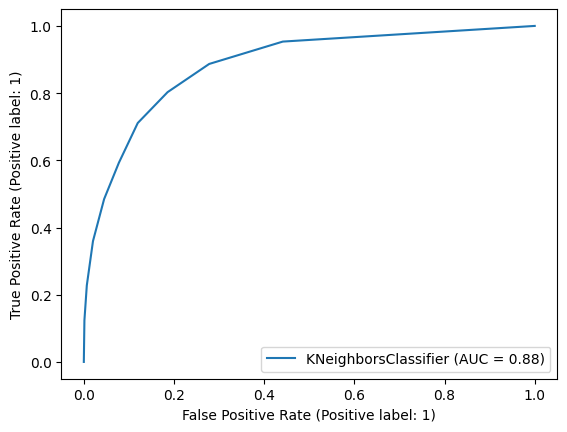

In [242]:
plot_roc_curve(knn_model, X_test_scaled, y_test)
plt.show()

In [243]:
y_pred_proba = knn_model.predict_proba(X_test_scaled)
roc_auc_score(y_test, y_pred_proba[:,1])

0.8843242843023071

**YORUM:**  AUC skoru 0.87 olup. gorece iyi kabul edilebilir. 

# Decision Tree Classification

DT modellerinde **scaling edilmemis** veriler kullaniliyordu. 

Bir de DT modelleri feature sayisina duyarliydi. Feature sayisinin cok artmamasi icin One-Hot Encoding yapilmis veri setiyle degil, **Label Encoding yapilmis** veri setiyle gitmek daha dogru olacak.  

Bu nedenle verileri yeniden duzenleyerek baslayalim.

In [201]:
df.head(3) 


# veri setimizi copy yaptigimiz durumuna geri dondurduk. 
# Scaling yok, encoding yok, sadece feature engineeringler var bu data setinde. 

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country,income
1,82,Private,132870,9,0,Exec-managerial,0,1,0,0,4356,18,1,0
3,54,Private,140359,4,0,Machine-op-inspct,0,1,0,0,3900,40,1,0
4,41,Private,264663,10,0,Prof-specialty,1,1,0,0,3900,40,1,0


## Label Encoding

In [202]:
X=df.drop(["income"], axis=1)
y=df["income"]

In [203]:
# X teki kategorik sutnlari secelim;

cat = X.select_dtypes("object").columns
cat

Index(['workclass', 'occupation'], dtype='object')

In [204]:
X[cat]

,workclass,occupation
1,Private,Exec-managerial
3,Private,Machine-op-inspct
4,Private,Prof-specialty
5,Private,Other-service
6,Private,Adm-clerical
...,...,...
32556,Private,Protective-serv
32557,Private,Tech-support
32558,Private,Machine-op-inspct
32559,Private,Adm-clerical


In [206]:
# Label encoding uygulayalim;

from sklearn.preprocessing import LabelEncoder

encoders = {}
for column in cat:
    lab_enc = LabelEncoder()
    X[column] = lab_enc.fit_transform(X[column])
    encoders[column] = lab_enc  # Oluşturulan LabelEncoder nesnesini sözlükte saklayalım

In [209]:
X.sample(10)

,age,workclass,fnlwgt,education.num,marital.status,occupation,relationship,race,sex,capital.gain,capital.loss,hours.per.week,native.country
17963,43,2,128354,9,0,3,0,1,0,0,0,40,1
22113,43,4,34007,13,1,4,1,1,1,0,0,70,1
17413,26,2,250066,11,0,7,0,1,0,0,0,40,1
30684,31,2,168906,13,0,3,0,1,0,0,0,50,1
30140,54,4,156800,13,1,2,1,1,1,0,0,50,1
13228,36,2,116608,9,0,6,0,1,0,0,0,38,1
1916,41,2,101593,14,1,9,1,1,1,15024,0,50,1
8856,19,2,169853,9,0,6,1,1,1,0,0,24,1
2841,40,1,153031,14,1,9,1,1,1,7298,0,35,1
15084,25,2,211424,13,0,3,1,1,1,0,0,40,1


In [ ]:
#  Label encoding basarili bir sekilde yapildi. 

## Train-Test Split

In [213]:
from sklearn.model_selection import train_test_split

In [214]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, random_state = 42)

In [ ]:
# Scaling yapmadik. Ama SMOTE yapmamizin yararli olacagini dusunuyorum.

## SMOTE with Oversampling

Az olan gozlem sayisini artirarak cok olana yaklastirma islemi yapiyoruz.

In [216]:
print("Before OverSampling, counts of label '1': {}".format(sum(y_train == 1)))
print("Before OverSampling, counts of label '0': {} \n".format(sum(y_train == 0)))

# import SMOTE module from imblearn library
# pip install imblearn (if you don't have imblearn in your system)

from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state = 42)

X_train_res, y_train_res = sm.fit_resample(X_train, y_train) 
#y_train.ravel

print("After OverSampling, counts of label '1': {}".format(sum(y_train_res == 1)))
print("After OverSampling, counts of label '0': {}".format(sum(y_train_res == 0)))

Before OverSampling, counts of label '1': 6765
Before OverSampling, counts of label '0': 20380 

After OverSampling, counts of label '1': 20380
After OverSampling, counts of label '0': 20380


** SMOTE islemi oncesinde train setinde 6757 tane 1, 20388 tane 0 varken, SMOTE islemi sayesinde 1 sayisi da 20688'e yukseldi ve data **balanced** hale geldi. 


Artik veri seti analize hazir

## Modelling 

In [219]:
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor

In [220]:
DT_model = DecisionTreeClassifier(random_state=42)

In [221]:
DT_model.fit(X_train_res, y_train_res)

DecisionTreeClassifier(random_state=42)

In [222]:
# regresyon tahminlerini alalim;

y_pred = DT_model.predict(X_test)
y_train_pred = DT_model.predict(X_train_res)

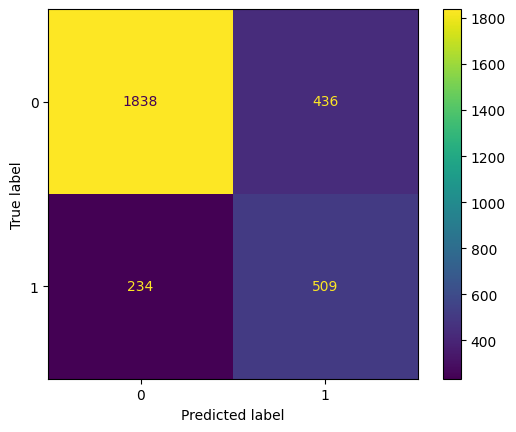

In [223]:
plot_confusion_matrix(DT_model,X_test,y_test)
plt.show()

**YORUM:** Label encoding ve SMOTE yapilip, scaling yapilmayan verilerle gerceklestiirlen bu analizde; 

modelin hata sayisi 534'ten 670'e yukselmistir. Model 3017 test gozleminden 2347'sini  dogru tahmin eden model, 670'ini hatali ongormustur.

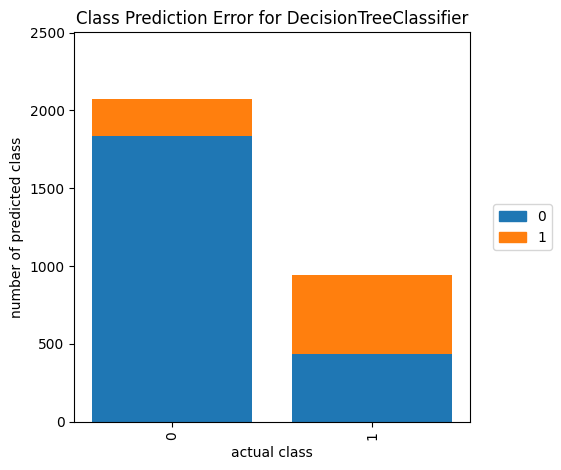

In [225]:
# Modelin hatalarini bar grafiginde gorelim;

from yellowbrick.classifier import ClassPredictionError

visualizer = ClassPredictionError(DT_model)

# Fit the training data to the visualizer
visualizer.fit(X_train_res, y_train_res)

# Evaluate the model on the test data
visualizer.score(X_test, y_test)

# Draw visualization
visualizer.poof();

## Model Performance 

In [226]:
def eval_metric(model, X_train_res, y_train_res, X_test, y_test):
    y_train_pred = model.predict(X_train_res)
    y_pred = model.predict(X_test)
    
    print("Test_Set")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))
    print()
    print("Train_Set")
    print(confusion_matrix(y_train_res, y_train_pred))
    print(classification_report(y_train_res, y_train_pred))

In [227]:
eval_metric(DT_model, X_train_res, y_train_res, X_test, y_test)

Test_Set
[[1838  436]
 [ 234  509]]
              precision    recall  f1-score   support

           0       0.89      0.81      0.85      2274
           1       0.54      0.69      0.60       743

    accuracy                           0.78      3017
   macro avg       0.71      0.75      0.72      3017
weighted avg       0.80      0.78      0.79      3017


Train_Set
[[20380     0]
 [    1 20379]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     20380
           1       1.00      1.00      1.00     20380

    accuracy                           1.00     40760
   macro avg       1.00      1.00      1.00     40760
weighted avg       1.00      1.00      1.00     40760



**YORUM:** Train datasina ait sonuclar ile test datasina ait sonuclar arasinda cok buyuk fark var. Belirgin bicimde OVERFITTING var. 

Bu analizde f1 0.66'dan 0.60'a dusmus, model kotu bir performansa sahip.


Bu sonucun dogrulugunu sinayabilmek icin CV yapalim;

## Cross Validation

In [228]:
from sklearn.model_selection import cross_validate, cross_val_score

model = DecisionTreeClassifier(random_state=42)

scores = cross_validate(model, X_train_res, y_train_res, scoring = ["accuracy", "precision_micro", "recall_micro", "f1_micro"], cv = 10)
df_scores = pd.DataFrame(scores, index = range(1, 11))
df_scores

,fit_time,score_time,test_accuracy,test_precision_micro,test_recall_micro,test_f1_micro
1,0.260067,0.012346,0.775270,0.775270,0.775270,0.775270
2,0.240081,0.011082,0.761040,0.761040,0.761040,0.761040
3,0.239816,0.011018,0.767910,0.767910,0.767910,0.767910
4,0.248309,0.011466,0.814524,0.814524,0.814524,0.814524
5,0.236915,0.011997,0.832679,0.832679,0.832679,0.832679
6,0.238617,0.011012,0.833660,0.833660,0.833660,0.833660
7,0.243698,0.012103,0.847154,0.847154,0.847154,0.847154
8,0.238867,0.011129,0.834151,0.834151,0.834151,0.834151
9,0.240115,0.012089,0.839794,0.839794,0.839794,0.839794
10,0.242781,0.011005,0.825564,0.825564,0.825564,0.825564


In [229]:
df_scores.mean()[2:]

test_accuracy           0.813175
test_precision_micro    0.813175
test_recall_micro       0.813175
test_f1_micro           0.813175
dtype: float64

**YORUM:** Elde edilen sonuclar test datasina ait sonuclardan yuksektir. Demek ki modelde kesin OVERFITTING sorunu var, model ogrenememis veya bu veri seti icin DT uygun bir classification yontemi degil. 

## Features Importance

In [230]:
DT_model.feature_importances_

array([0.13914053, 0.0405756 , 0.186998  , 0.10752602, 0.19202789,
       0.07304192, 0.00782572, 0.00850721, 0.01036883, 0.07219575,
       0.02231326, 0.12971379, 0.00976548])

In [231]:
df_f_i = pd.DataFrame(index=X.columns, data = DT_model.feature_importances_,
                     columns = ["feature Importance"]).sort_values("feature Importance")
df_f_i

,feature Importance
relationship,0.007826
race,0.008507
native.country,0.009765
sex,0.010369
capital.loss,0.022313
workclass,0.040576
capital.gain,0.072196
occupation,0.073042
education.num,0.107526
hours.per.week,0.129714


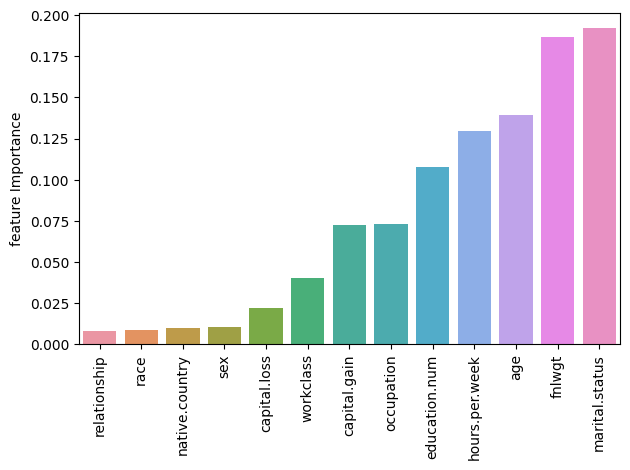

In [232]:
sns.barplot(x=df_f_i.index, y = "feature Importance", data = df_f_i)
plt.xticks(rotation = 90)
plt.tight_layout()
plt.show()

* Gelirin en onemli featurenin "marital status", "fnlwgt" ve "age" oldugu gorulmektedir. 

## Visualizing trees

In [233]:
from sklearn.tree import plot_tree

In [234]:
%matplotlib inline

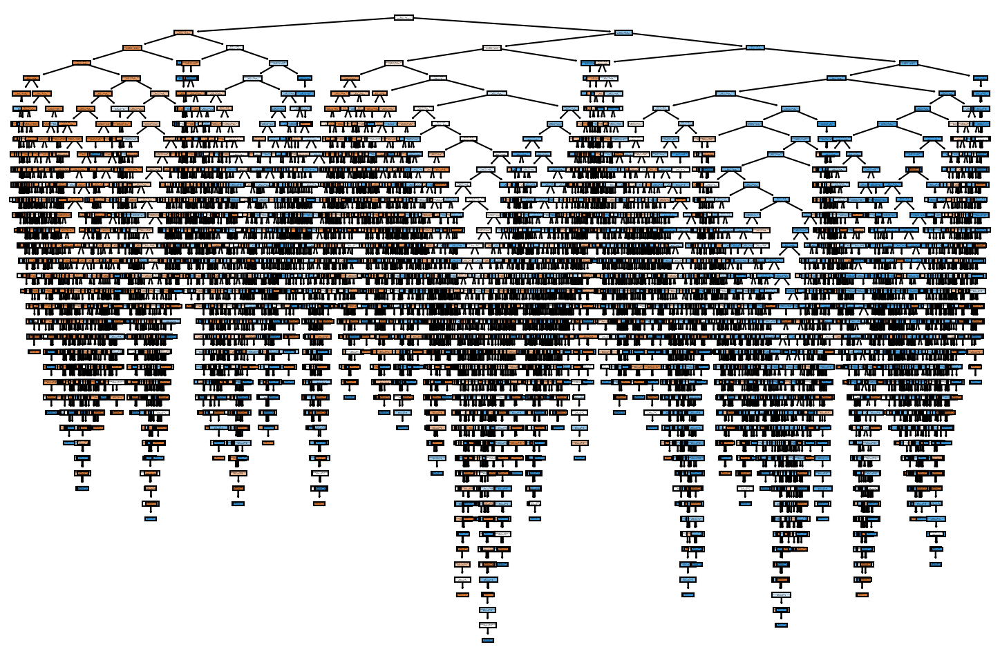

In [235]:
plt.figure(figsize=(12,8), dpi=150)
plot_tree(DT_model, filled=True, feature_names=X.columns);
plt.show()

In [ ]:
# Agacin cok dallandigini goruyoruz. Max depth i sinirlandiralim (agaci biraz budayalim);

In [236]:
pruned_tree = DecisionTreeClassifier(max_depth=3, random_state=42)
pruned_tree.fit(X_train,y_train)

DecisionTreeClassifier(max_depth=3, random_state=42)

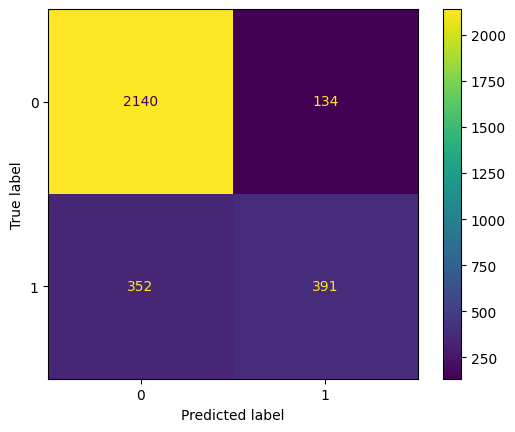

In [237]:
plot_confusion_matrix(pruned_tree,X_test,y_test)
plt.show()

In [238]:
def report_model(model):
    y_pred = model.predict(X_test)
    y_train_pred = model.predict(X_train_res)
    print('\n')
    print(train_val(model, X_train_res, y_train_res, X_test, y_test))
    print('\n')
    plt.figure(figsize=(12,8),dpi=100)
    plot_tree(model,filled=True, feature_names=X.columns, fontsize=6);

In [239]:
eval_metric(pruned_tree, X_train_res, y_train_res, X_test, y_test)

Test_Set
[[2140  134]
 [ 352  391]]
              precision    recall  f1-score   support

           0       0.86      0.94      0.90      2274
           1       0.74      0.53      0.62       743

    accuracy                           0.84      3017
   macro avg       0.80      0.73      0.76      3017
weighted avg       0.83      0.84      0.83      3017


Train_Set
[[19310  1070]
 [11970  8410]]
              precision    recall  f1-score   support

           0       0.62      0.95      0.75     20380
           1       0.89      0.41      0.56     20380

    accuracy                           0.68     40760
   macro avg       0.75      0.68      0.66     40760
weighted avg       0.75      0.68      0.66     40760



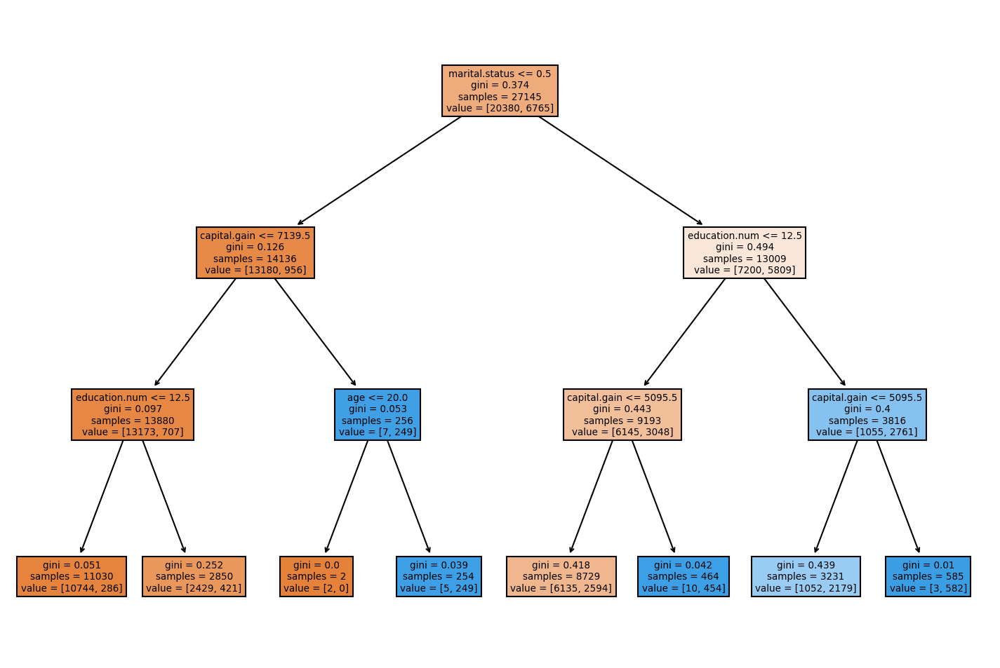

In [240]:
plt.figure(figsize=(12,8), dpi=150)
plot_tree(pruned_tree, filled=True, feature_names=X.columns);
plt.show()
# agaci budadik, traini biraz bozduk, test ile mantikli hale geldi max_dept = 3 diyerek basardik bunu

**YORUM:** Max depth i 3 yaparak agaci biraz budadigimizda model geliri 50K'dan dusuk olanlari (0 classina ait olanlari) daha dogru tahmin ederken (2142 kisi), geliri 50K'dan yuksek (1 classina dahil) olanlari daha az dogru (363 kisi) tahmin edebilmistir. Skorlar kotulesmis, recall 0.47'ye, f1 0.59'a gerilemistir. 

## Drop most important feature

* En onemli feature olan marital status'u atarak bu analizi tekrar yapalim

In [243]:
X2 = X.drop(columns = ["marital.status"], axis =1) # En onemli olani dusurelim

In [244]:
X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y, test_size=0.1, random_state=42)

In [245]:
DT2_model = DecisionTreeClassifier(random_state=42)

In [246]:
DT2_model.fit(X_train2, y_train2) 

DecisionTreeClassifier(random_state=42)

In [247]:
eval_metric(DT2_model, X_train2, y_train2, X_test2, y_test2)

Test_Set
[[1968  306]
 [ 299  444]]
              precision    recall  f1-score   support

           0       0.87      0.87      0.87      2274
           1       0.59      0.60      0.59       743

    accuracy                           0.80      3017
   macro avg       0.73      0.73      0.73      3017
weighted avg       0.80      0.80      0.80      3017


Train_Set
[[20380     0]
 [    1  6764]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     20380
           1       1.00      1.00      1.00      6765

    accuracy                           1.00     27145
   macro avg       1.00      1.00      1.00     27145
weighted avg       1.00      1.00      1.00     27145



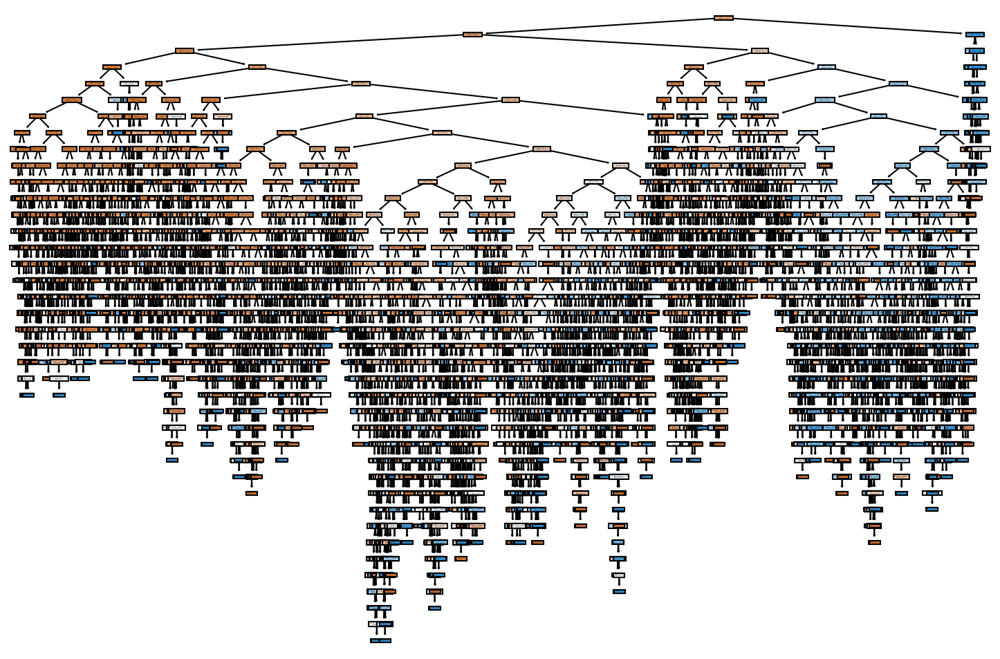

In [248]:
plt.figure(figsize=(12,8), dpi=150)
plot_tree(DT2_model, filled=True, feature_names=X2.columns);
plt.show()
# En onemli feature i atarak yapiyoruz bu islemi;

**YORUM:** En onemli feature atilip. max depth sinirlandirilmadan yapilan bu analizde Modelin 1'leri dogru tahmin etme basasarisi 455'ten 449'a duserken 0'lari dogru tahmin etme basarisi 1994'ten 2010'a yukselmistir. Precision 0.94'ten 0.65'e, recall 0.59'dan 0.58'e gelmis, f1 skoru degismeyerek 0.62'de kalmistir.  

## GridSearchCV

Optimal derinligi' yaprak sayisini ve diger bilgileri GridSeachCV ile elde edelim.

In [249]:
from sklearn.model_selection import GridSearchCV

In [250]:
model = DecisionTreeClassifier(random_state=42)

In [251]:
param_grid = {"splitter":["best", "random"],
              "max_features":[None, "auto", "log2", 2, 3, 4, 5, 6, 7],  
              "max_depth": [None, 2, 3, 4, 5],
              "min_samples_leaf": [1, 2, 3, 4, 5, 6, 7],
              "min_samples_split": [2, 3, 5, 6, 7, 8, 9]}

In [252]:
grid_model = GridSearchCV(estimator=model,
                          param_grid=param_grid,
                          scoring='f1_micro',  #  ya da f1 macro da yazabilirdik
                          cv=10,
                          n_jobs = -1)

In [254]:
grid_model.fit(X_train2, y_train2) # en onemli feature attiktan sonra yola yeni veri setiyle devam ettik

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(random_state=42),
             n_jobs=-1,
             param_grid={'max_depth': [None, 2, 3, 4, 5],
                         'max_features': [None, 'auto', 'log2', 2, 3, 4, 5, 6,
                                          7],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7],
                         'min_samples_split': [2, 3, 5, 6, 7, 8, 9],
                         'splitter': ['best', 'random']},
             scoring='f1_micro')

In [255]:
grid_model.best_params_

{'max_depth': None,
 'max_features': 4,
 'min_samples_leaf': 7,
 'min_samples_split': 2,
 'splitter': 'best'}

In [256]:
eval_metric(grid_model, X_train2, y_train2, X_test2, y_test2)

Test_Set
[[2062  212]
 [ 300  443]]
              precision    recall  f1-score   support

           0       0.87      0.91      0.89      2274
           1       0.68      0.60      0.63       743

    accuracy                           0.83      3017
   macro avg       0.77      0.75      0.76      3017
weighted avg       0.82      0.83      0.83      3017


Train_Set
[[19205  1175]
 [ 2021  4744]]
              precision    recall  f1-score   support

           0       0.90      0.94      0.92     20380
           1       0.80      0.70      0.75      6765

    accuracy                           0.88     27145
   macro avg       0.85      0.82      0.84     27145
weighted avg       0.88      0.88      0.88     27145



**YORUM:** Label encoding ve SMOTE yapilip, scaling yapilmayan verilerle gerceklestirilen bu analizde;

modelin hata sayisi 534'ten 512'ye inmis, f1 0.63 olmustur. 


Aagidaki sonuclarla karsilastirildiginda **en iyi skorlarin SMOTE Oversampling yapilmis Logistic Regression analizinde** elde edildigi gorulmektedir. 


* Logistic Regresyonda elde edilen final sonuclar;

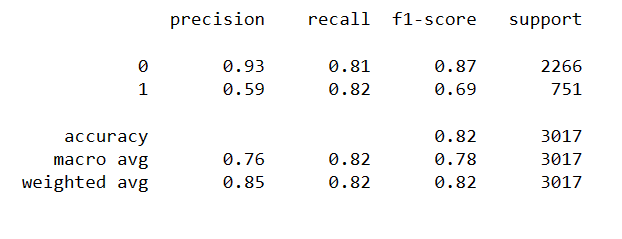




* KNN de GridSearch ile elde edilen final skorlar bunlardi;
  
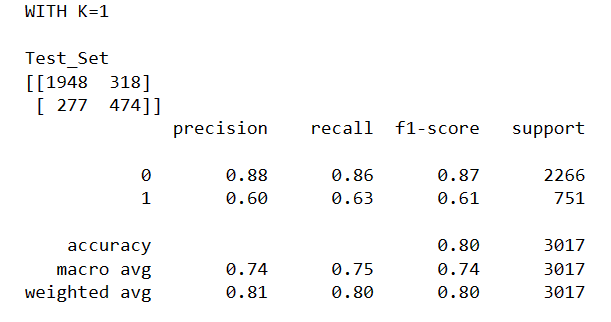  
  
  
  
  
 * DT de elde edilen ilkel skorlar; 
  
  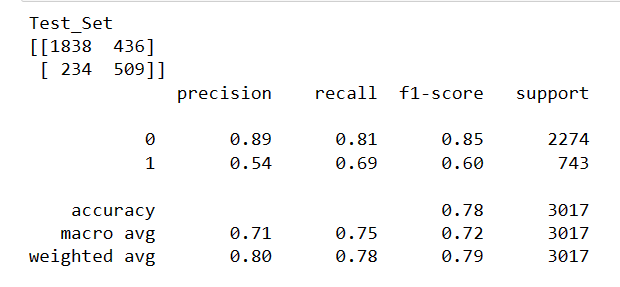
  
  
  

**YORUM:**

# CONCLIUSSION


Bu caklismada ABD'de yasayan kisilerin gelirlerini etileyen faktorler ele alinmisir. 1994 yili nufus sayimi verileri kullanilarak olusutulan data setinde 32561 satir (kisi, gozlem) ve bu kisilere ait 15 feature (bilgi, sutun) yer almaktadir. Calismanin hedef degiskeni; kisilerin gelirlerinin 50K'dan buyuk olup olmadiginin tahmin edilmesi amaclanmaktadir.

Veri setini tanimaya yoneliok yapilan Kesifsel Veri Analizinde (EDA); ele alina  kisilerden %75'inin gelirinin 50K'dan dusuk, %25'inin gelirinin 50K'den yuksek oldugu bulunmustur. Veri setinde "workclass", "occupation" ve "native.country" columnsda ? olarak girilen yerler oldugu gorulmus olup, bunlar once NumPy kutuphanesi kullanilarak "nan" ghaline donusuturlmus, sonra drop edilmistir. Bu islem neticeinde 2399 yani toplam gozlemlerin %7.36'si analiz disi birakilmis, analizler 30162 gozlem ile gerceklestirilmisitir. "income" serisi 50K'dan az kazananlar 0, fazla kazananlar 1 olacak sekilde sayisala cevrilmistir. Calismada kategorik bir "education" serisi ve bunun sayisal hale getirilmis "education.num" bicimi vardi. Ayni seyi ifade eden bu iki sutundan, daha kullanissiz olan  "education" sutunu drop edilmistir. "marital.status" serisinde 7 farkli kategori bulunmaktaydi.  Burada birbiriyle ayni/bezner seyleri ifade eden kategoriler bulunmaktaydi. Ornegin; "married-civ-spouse"; sivil bir es ile evli olan kisileri gosterirken, "married-AF-spouse"; asker bir es ile evli olanlari, "married-spouse-absent"; evli ama esi uzakta calisanlari ifade etmekteydi. Ama sonucta bunlarin hepsi evli kisiler olduj=klari icin evli ('Married-civ-spouse', 'Married-spouse-absent', 'Married-AF-spouse') olanlari 1, digerleri 0 olacak sekilde numerik hale getirildi.  "native.country" sutununda da cok sayida unique deger (ulke) bulunmaktaydi.  Bu veri seti ABD'de yasayan kisilerin gelirlerine odaklandigi icin burada onemli olan; incelenen kisinin ABD vatandasi olup olmadigidir. Bu nedenle bu feature'i 'United-States' = 1, digerleri = 0 olacak sekilde duzenlendi. "race" sutunundaki kategorik degiskenler ele alinirken; eski ABD anlayisina gore irk noktasinda calisan kisinin "White" olup olmadigi onemli oldugu icin "White" = 1, digerleri = 0 seklinde degistirildi. Cinsiyet noktasinda 2 grup veri bulunmaktaydi. Literaturdeki calisalarda calismalarda genellikle kadinlara yonelik negatif bir ayrimcilik olup olmadigina bakildigi, bu amacla da genellikle male = 1, female = 0 verilerek kategorik seri numerik hale getirildi. "relationship" sutununda yer alan 'Husband', 'Wife' ve 'Own-child'; evli ve sorumluluk sahibi kisileri gosterdigi icin 1, digerleri 0 olarak sinifladirildi. "workclass" ve "occupation" sutunlarina "One-Hot Encoding" islemi uygulanarak bu sutunlardaki kategorik veriler kukla degiskenlere (dummy variables) donusturuldu. Veri seti 10.000'den fazla gozlem icerdigi icin test kismina %10, train kismina %90'lik kisimlar ayrildi. StandardScaler kullanilarak veriler olceklendirildi (birbirlerine yakin buyuklukte haline getirildi). 


Calismada ilk olarak Machine Learning modellerinden **Logistic Regression** analiz gerceklestirldi. Ilkel analizde model 3017 test gozleminden 2573 tanesini dogru, 444 tanesini yanlis bilmistir. Veri seti dengesiz oldugu icin Precision, Recall ve f1-socore bakilmasi gerekmis, bunlarin sirasiyla 0.76, 0.60 ve 0.67 olduklari gorulmustur. Bu sonuclar train datasinave 10 parcalamali (fold) Cross Validation analiz sonucunda elde edilen skorlar da bu sonuclarla da uyumlu olup, analizde overfitting (asiri ezberleme) sorunu olmadigina karar verilmistir. Gridsearch ilebelirlenen optimum hyper parametreler kullanilarak yapilan analizde f1 skorunun 0.68'e cikmis, ama sonuclarin genel olarak iyi olmadigi degerlendirilmistir. Bu sorunun veri setindeki (hedef degiskendeki) dengesiz yapidan kaynaklanmis olabilecegi onsavindan hareketle "**SMOTE**" yontemlerinden "Oversampling" ve "Undersampling" islemleri yapilmis, f1 skorunun birincisinde 0.69'a ciktigi, ikincisinde (gozlem kaybi nedeniyle) 0.66'ya dustugu gorulmustur. 

Ikinci olarak **KNN** analizi gerceklestirilmis ama bu analizde hata sayisinin 480'e ciktigi gorulmustur. Optimum komsu sayisi belirleyebilmek icin Elbow yontemi ve Grid Search kullanilmis, ama modelin f1 skoru 0.65'i gecememistir.  

Son olarak **Decision Tree** analizi yapilmistir. DT analizlerinde feature sayisinin cok fazla olmasi modelin is yukunu artirdigi icin daha once One-JHot-Encoding yontemiyle yapilan dummy avriableye donusturme islemi **Label Encoding** ile gerceklestirilerek, daha az ek feature ile calsilmistir.  Bu analoz sonucunda hata sayisinin 512'ye ciktigi, f1 skorunun ise 0.63 oldugu gorulmustur.

Tum modellerin sonuclari bir arada degerlendirildiginde en iyi sonuclari veren modelin; SMOTE_Oversampling yapilmis Logistic Regression modelinden elde edildigi gorulmektedir. Bu modelin f1 skoru 0.69 olup, sonuclar cok mukemmel olmamaklambirlikte, kabul edilebilir duzeydedir. 

Bu analizin sonuclarina dayanarak; kisilerin gelirlerinin en onemli belirleyicilerinin; "marital status", "fnlwgt" ve "age" yani tecrube oldugu gorulmustur. Calisanlarin ve isverenlerin de bu gerceklerin farkinda olmalari yararlarina olacaktir. 











# REFERENCES

Guo, J., Basarkod, G., Perales, F., Parker, P. D., Marsh, H. W., Donald, J., Dicke, T., Sahdra, B. K., Ciarrochi, J., Hu, X., Lonsdale, C., Sanders, T., & del Pozo Cruz, B. (2022). The Equality Paradox: Gender Equality Intensifies Male Advantages in Adolescent Subjective Well-Being. Personality and Social Psychology Bulletin, 014616722211256. https://doi.org/10.1177/01461672221125619

Kraft, C. (2022).Equal pay behind the “Glass Door”? The gender gap in upper management in a male-dominated industry. Gender, Work, Organization. 29(6): 1910-1926. https://doi.org/10.1111/gwao.12890 

Main, Kelly (2021). Science Reveals How Elon Musk Can Work 120 Hours Per Week. It Has Nothing to Do With Time ManagementBut everyone can have this one simple thing for free.
https://www.inc.com/kelly-main/science-reveals-how-elon-musk-can-work-120-per-week-it-has-nothing-to-do-with-time-management.html.

Verniers C, Vala J (2018) Justifying gender discrimination in the workplace: The mediating role of motherhood myths. PLoS ONE
13(1): e0190657. https://doi.org/10.1371/journal.pone.0190657

The END